Automatically created module for IPython interactive environment
For n_clusters = 2 The average silhouette_score is : 0.7049787496083262


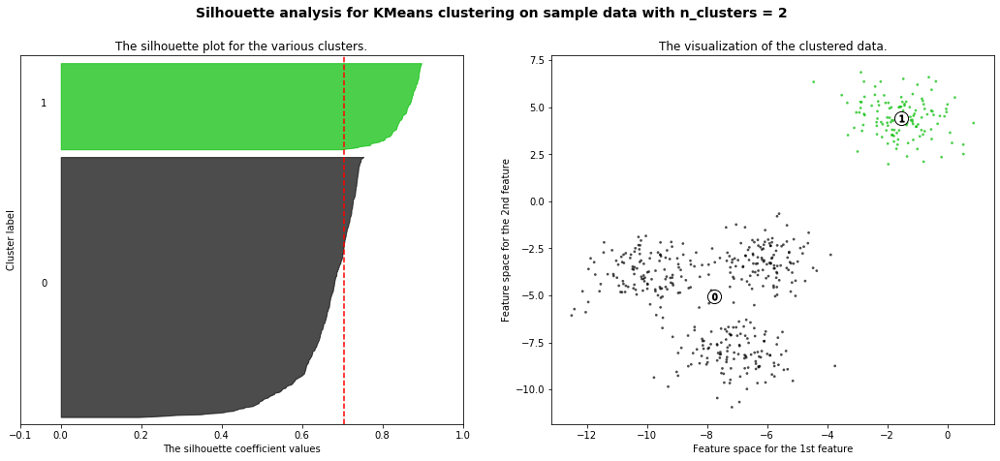

For n_clusters = 3 The average silhouette_score is : 0.5882004012129721


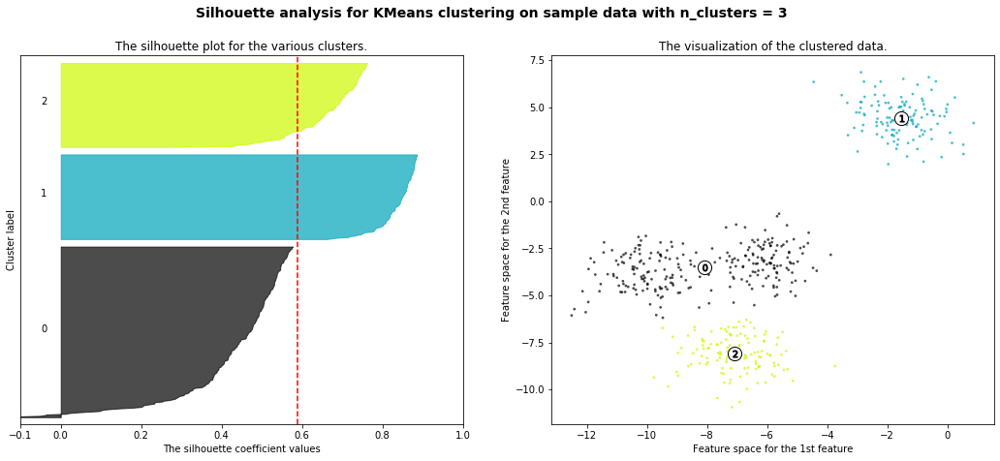

For n_clusters = 4 The average silhouette_score is : 0.6505186632729437


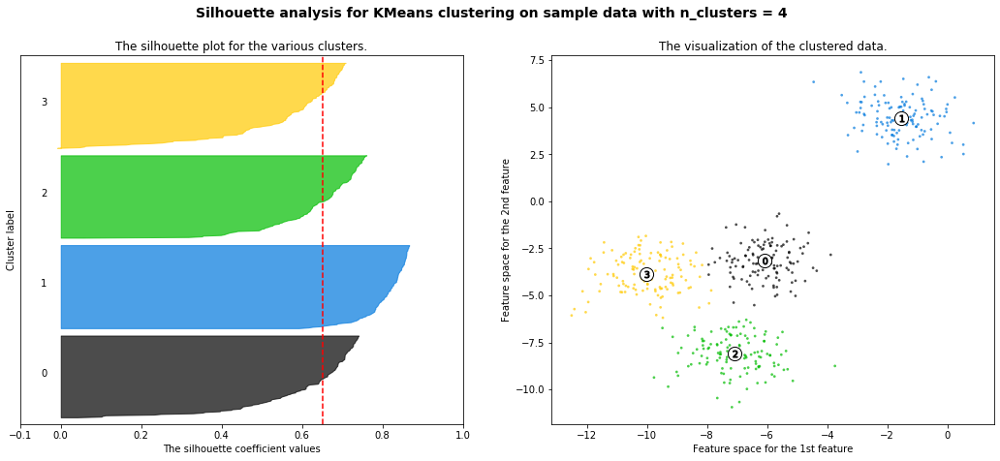

For n_clusters = 5 The average silhouette_score is : 0.56376469026194


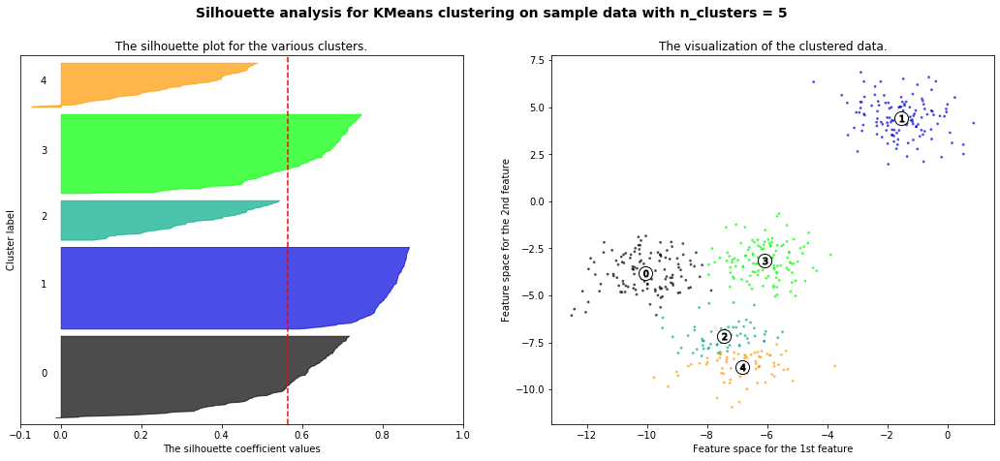

For n_clusters = 6 The average silhouette_score is : 0.4504666294372765


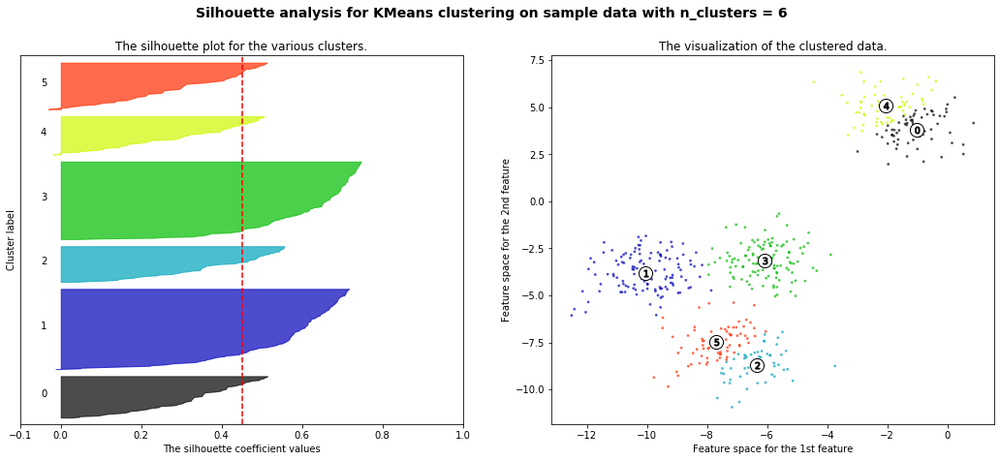

In [68]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

print(__doc__)

# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.
X, y = make_blobs(n_samples=500,
                  n_features=2,
                  centers=4,
                  cluster_std=1,
                  center_box=(-10.0, 10.0),
                  shuffle=True,
                  random_state=1)  # For reproducibility

range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

    plt.show()

In [120]:
def cluster(n_clusters):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    
    plt.show()

In [124]:
X, y = make_blobs(n_samples=5000,
                  n_features=2,
                  centers=4,
                  cluster_std=1,
                  center_box=(-10.0, 10.0),
                  shuffle=True,
                  random_state=10)





For n_clusters = 2 The average silhouette_score is : 0.4773374253242186


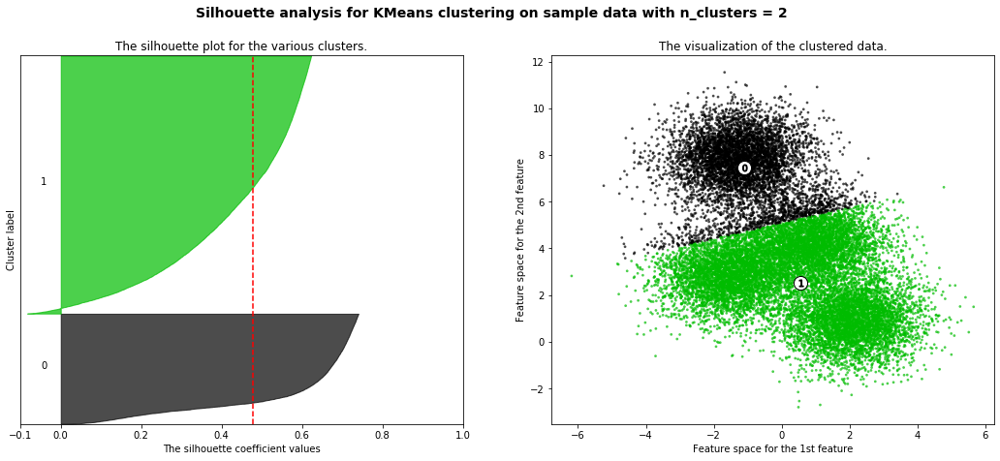

For n_clusters = 3 The average silhouette_score is : 0.46312421110831264


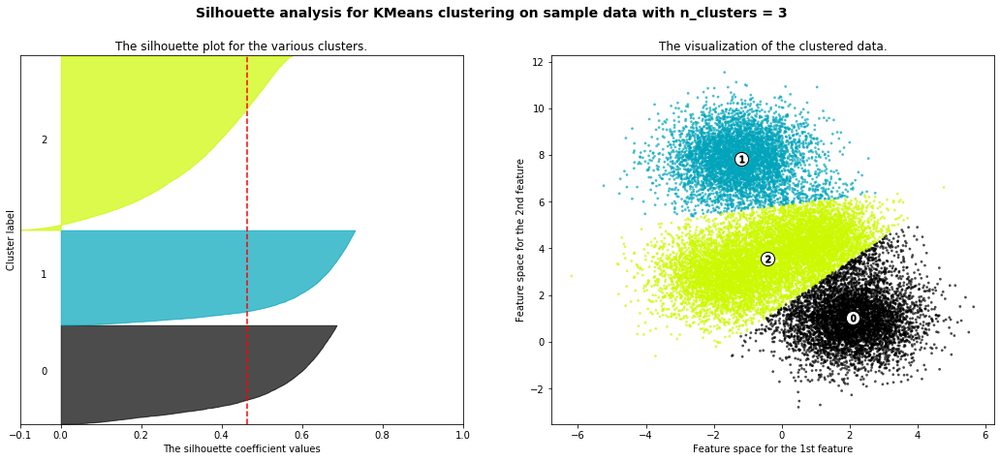

For n_clusters = 4 The average silhouette_score is : 0.4978413422612829


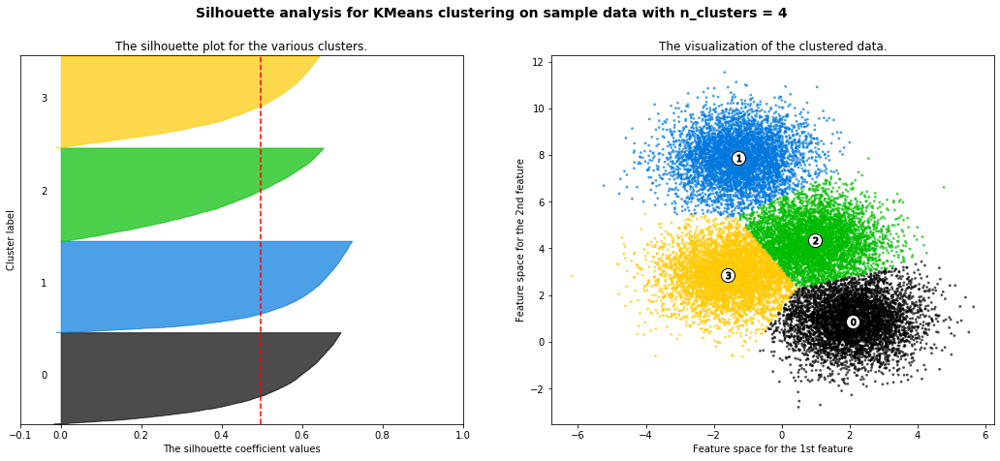

For n_clusters = 5 The average silhouette_score is : 0.43662751660489457


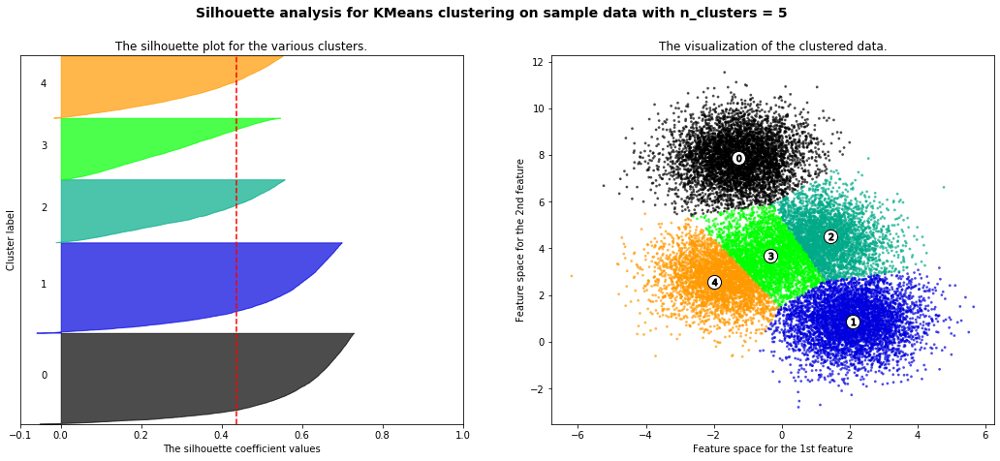





For n_clusters = 2 The average silhouette_score is : 0.6995210823214848


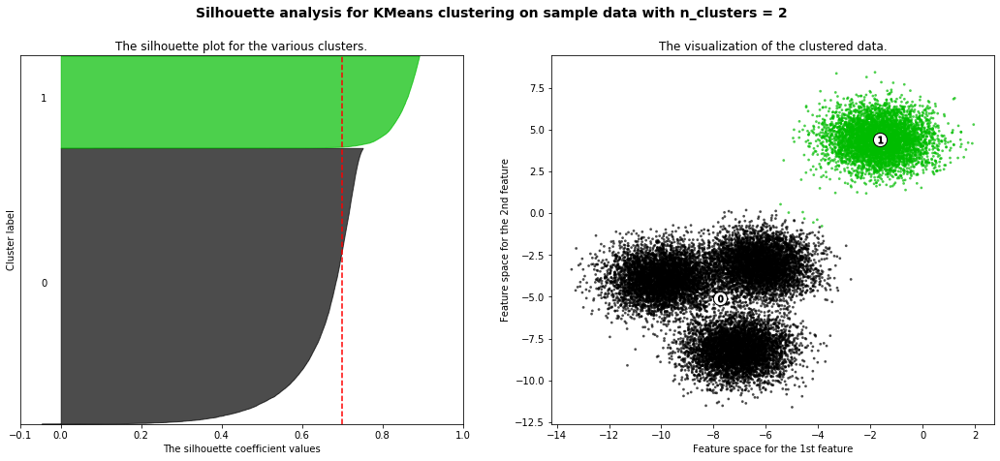

For n_clusters = 3 The average silhouette_score is : 0.590550851578109


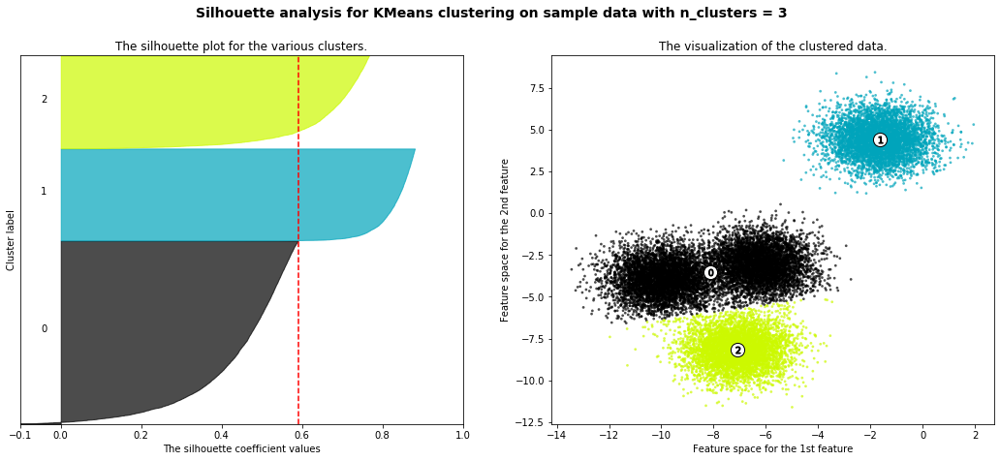

For n_clusters = 4 The average silhouette_score is : 0.6335699898305466


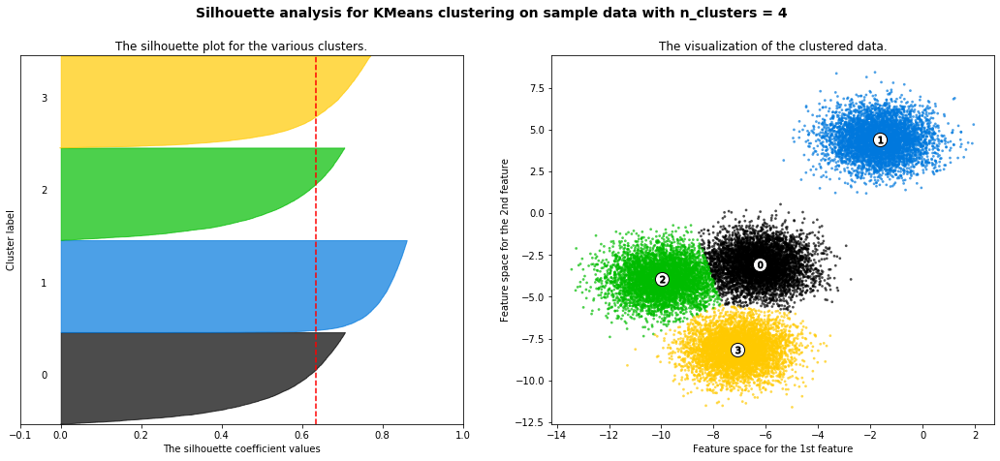

For n_clusters = 5 The average silhouette_score is : 0.5458679185922196


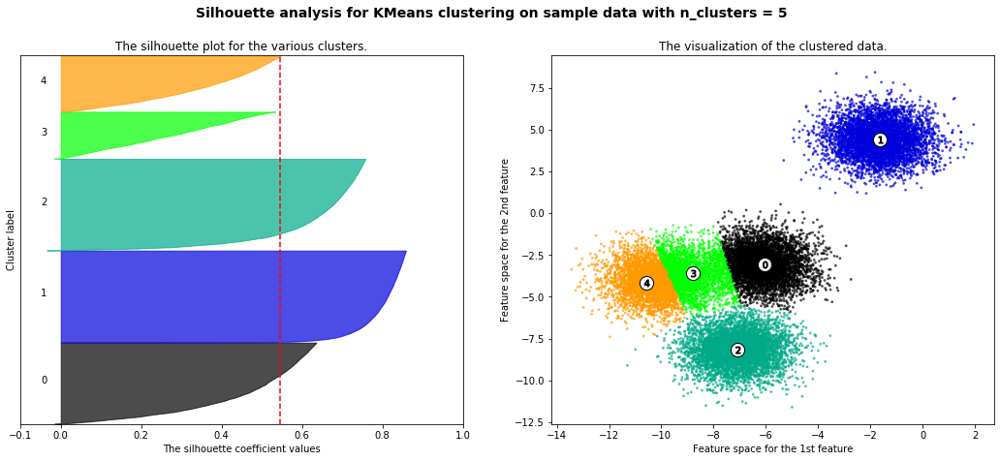





For n_clusters = 2 The average silhouette_score is : 0.5552374857499117


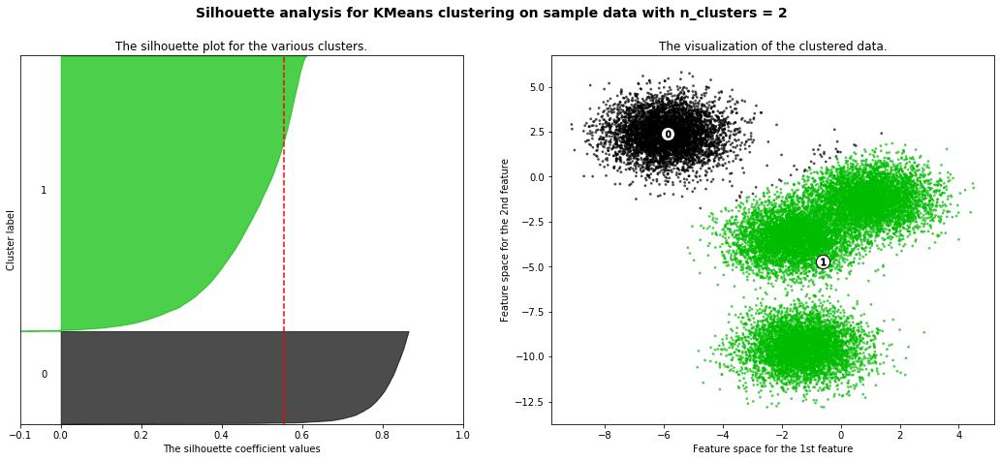

For n_clusters = 3 The average silhouette_score is : 0.6725003973257492


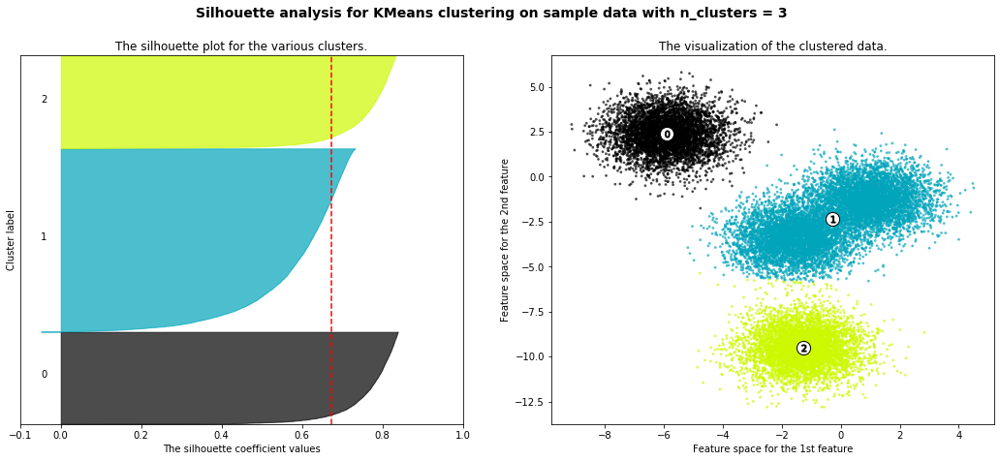

For n_clusters = 4 The average silhouette_score is : 0.6232605107339089


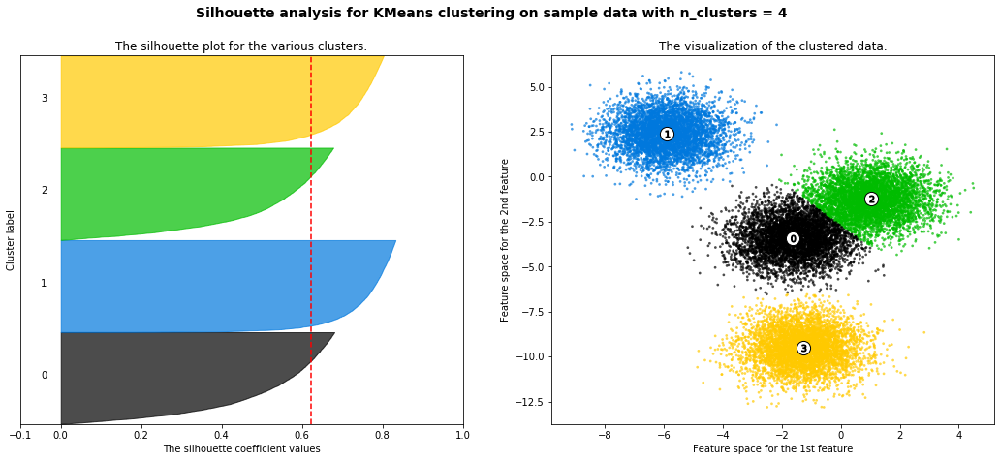

For n_clusters = 5 The average silhouette_score is : 0.536291326490667


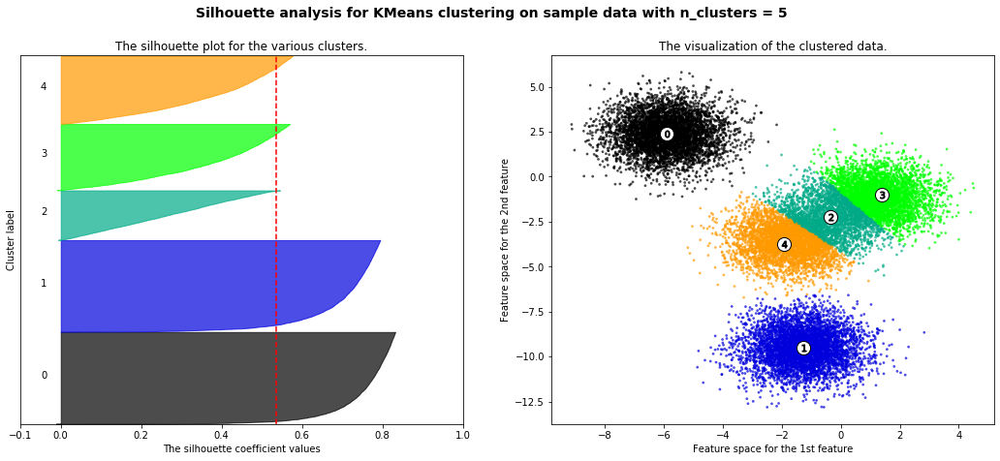





For n_clusters = 2 The average silhouette_score is : 0.6335385766628153


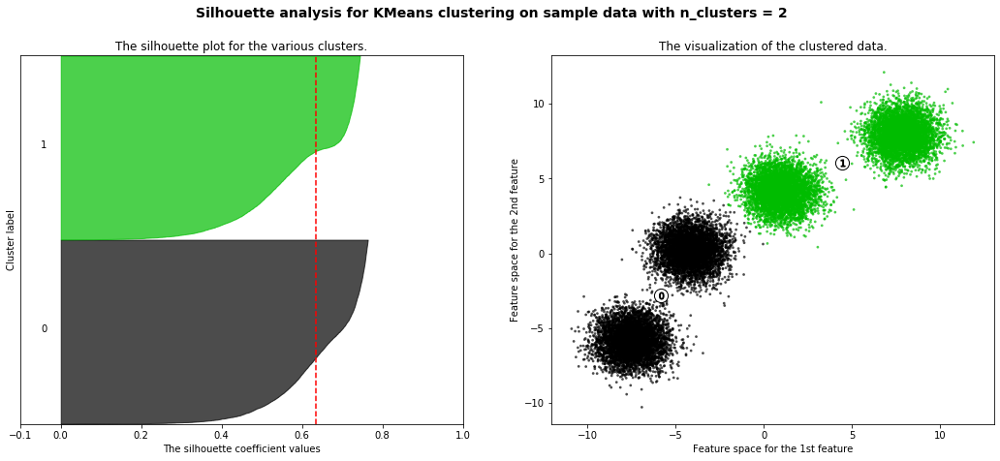

For n_clusters = 3 The average silhouette_score is : 0.6226382719231799


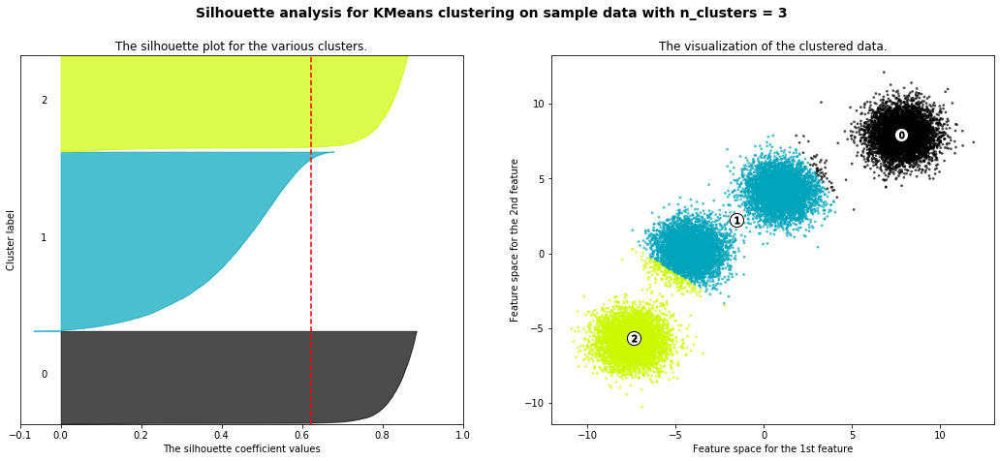

For n_clusters = 4 The average silhouette_score is : 0.7333699033113279


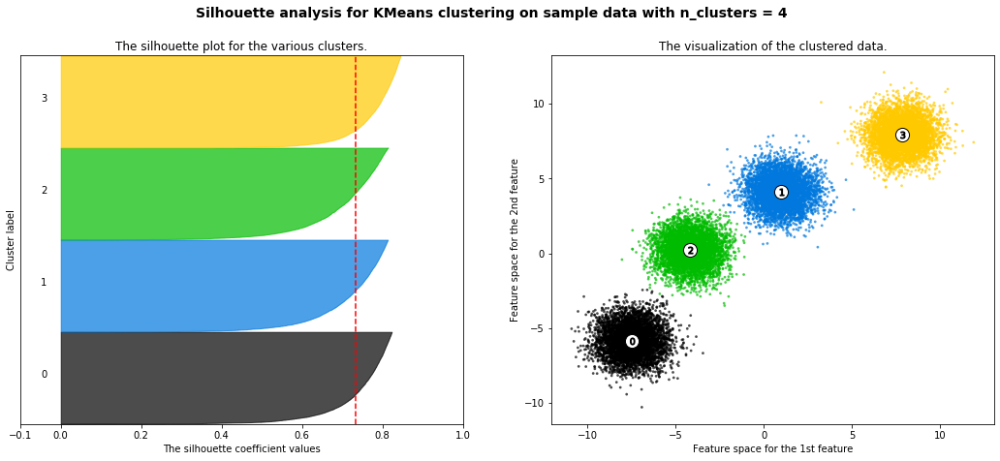

For n_clusters = 5 The average silhouette_score is : 0.6297332303456151


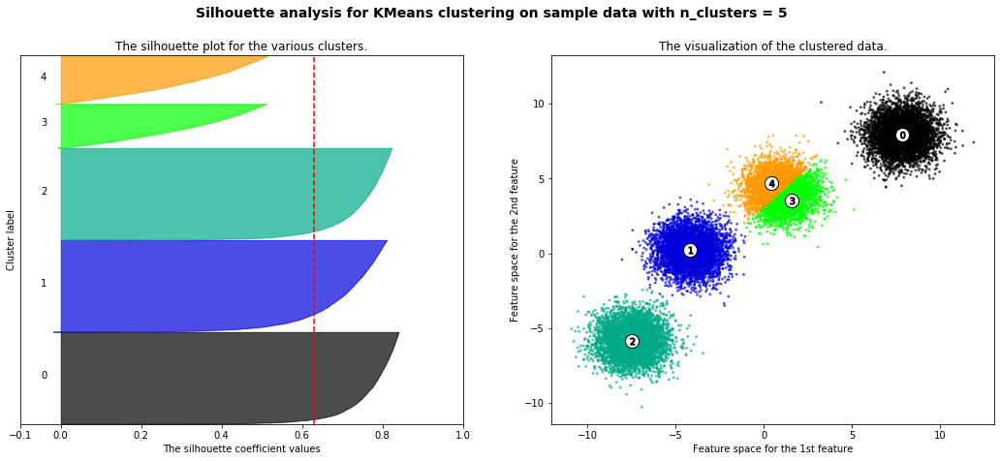





For n_clusters = 2 The average silhouette_score is : 0.6769281301073423


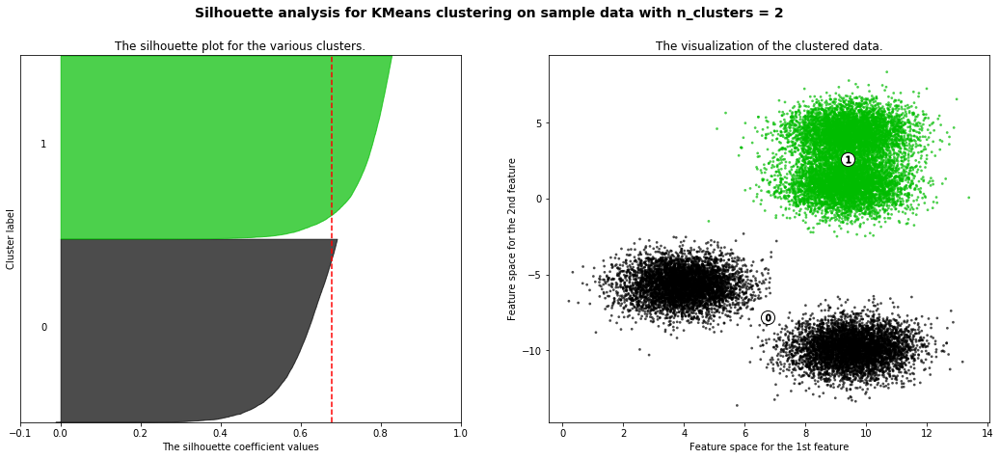

For n_clusters = 3 The average silhouette_score is : 0.7340024779210725


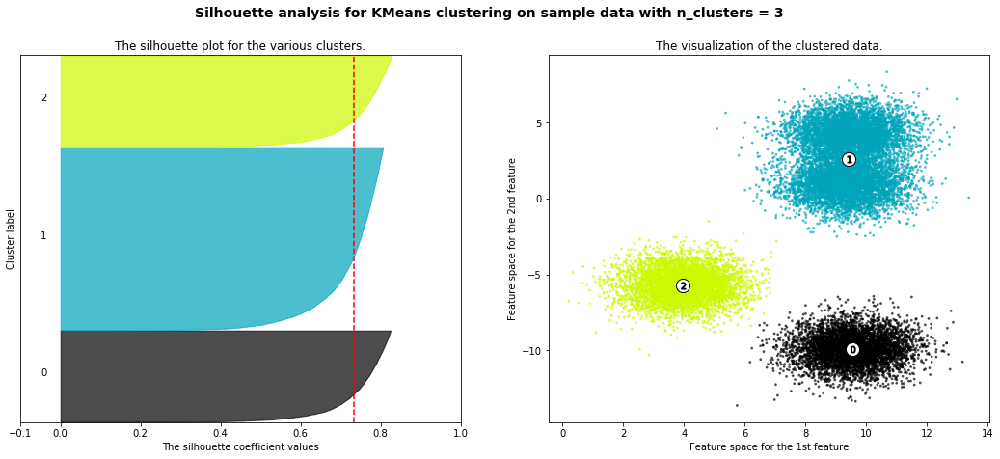

For n_clusters = 4 The average silhouette_score is : 0.6309752694883626


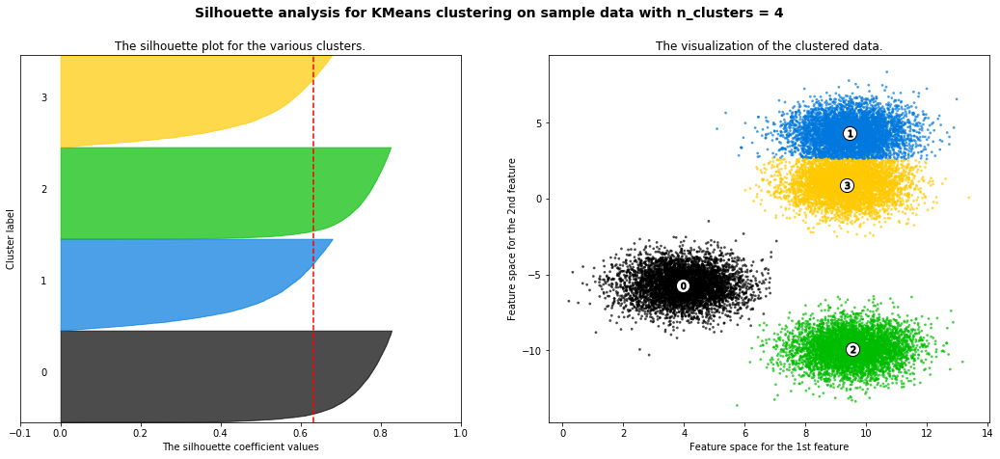

For n_clusters = 5 The average silhouette_score is : 0.5471109940933406


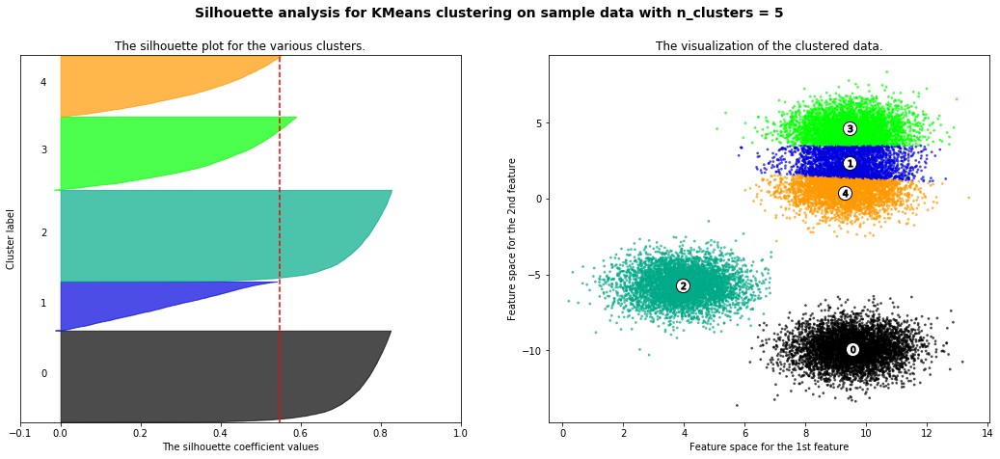





For n_clusters = 2 The average silhouette_score is : 0.7130397440637755


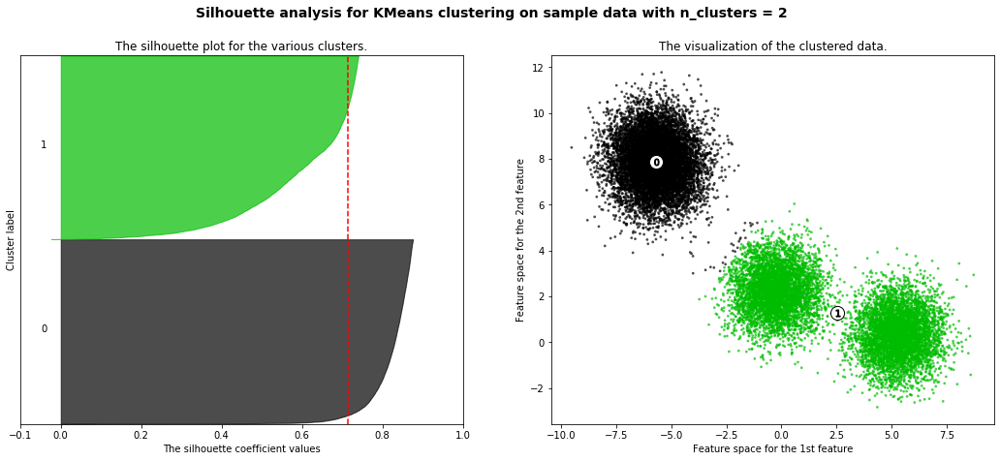

For n_clusters = 3 The average silhouette_score is : 0.7264927827667546


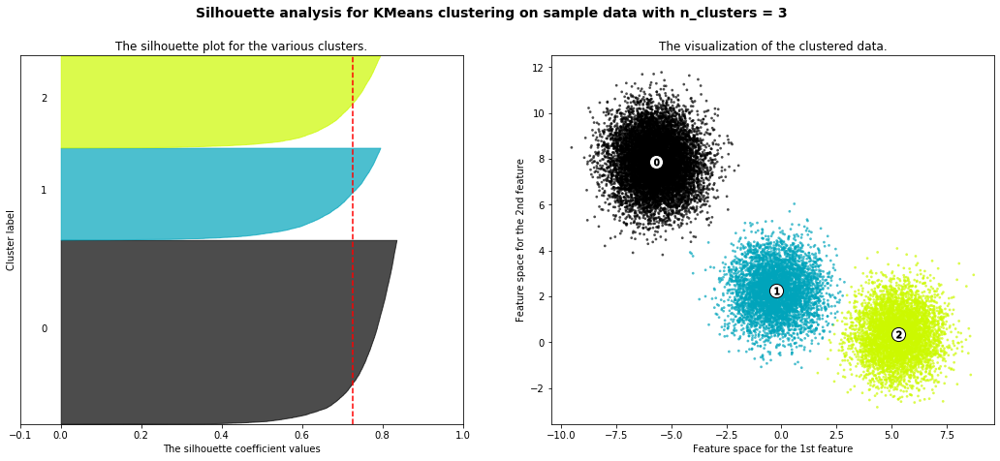

For n_clusters = 4 The average silhouette_score is : 0.5082475750199602


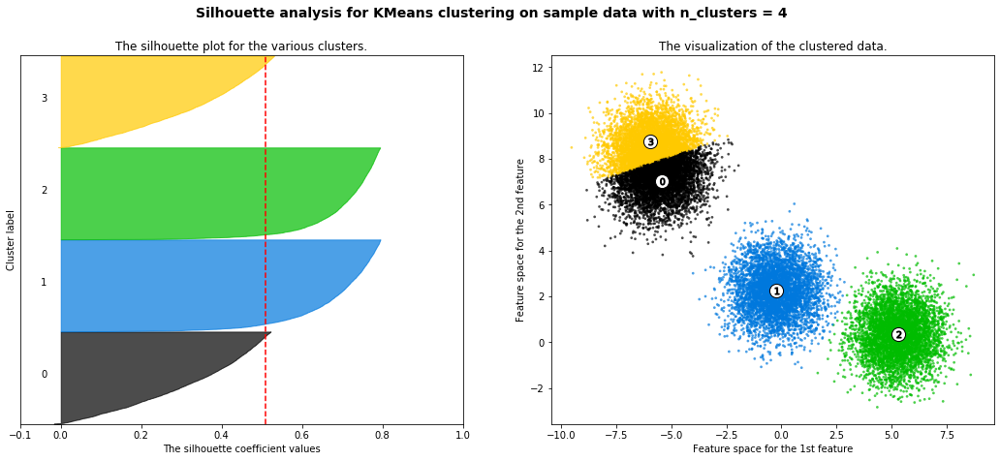

For n_clusters = 5 The average silhouette_score is : 0.5095033309428371


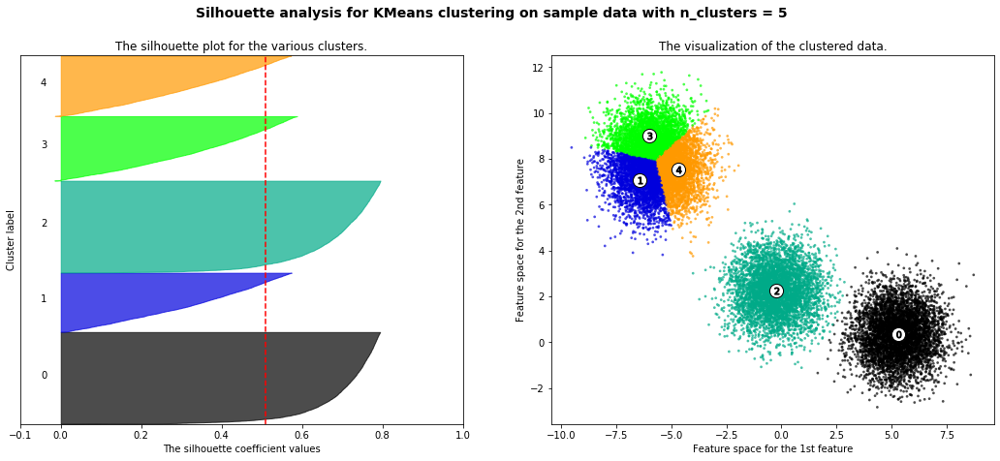





For n_clusters = 2 The average silhouette_score is : 0.600049317622633


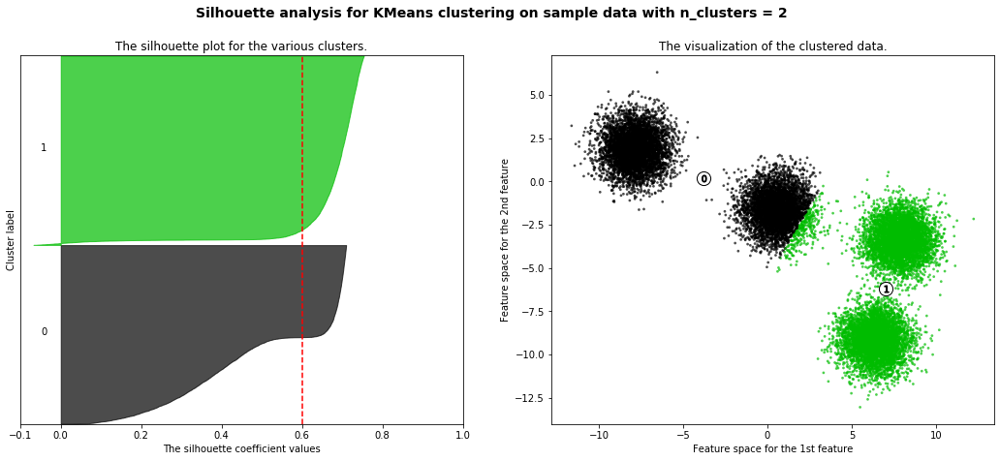

For n_clusters = 3 The average silhouette_score is : 0.6598074099653504


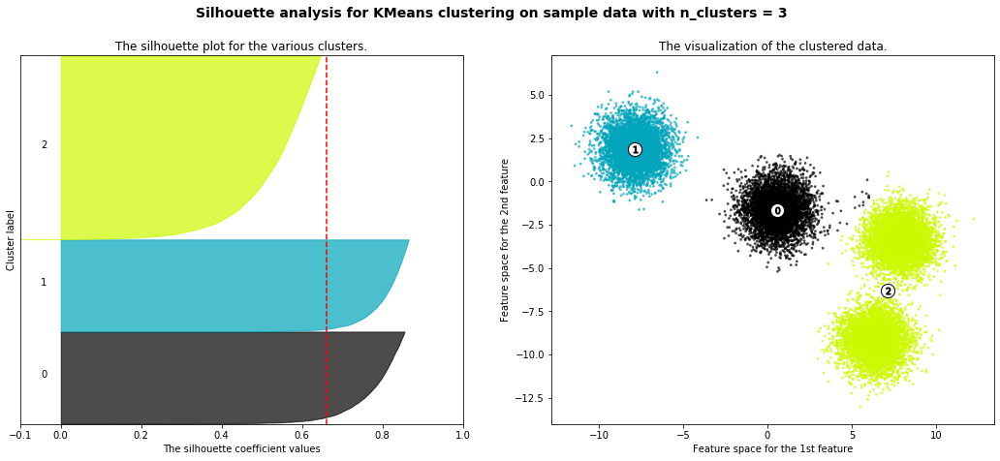

For n_clusters = 4 The average silhouette_score is : 0.7423422813590834


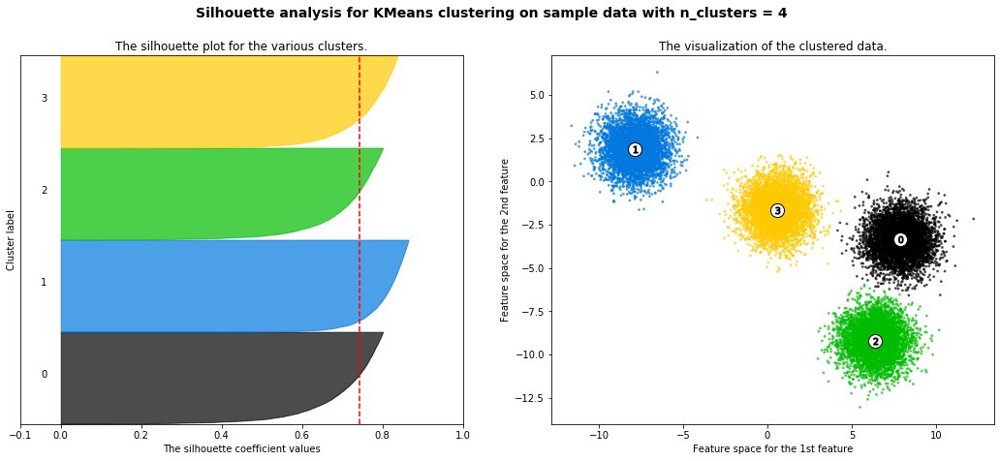

For n_clusters = 5 The average silhouette_score is : 0.6380126283991391


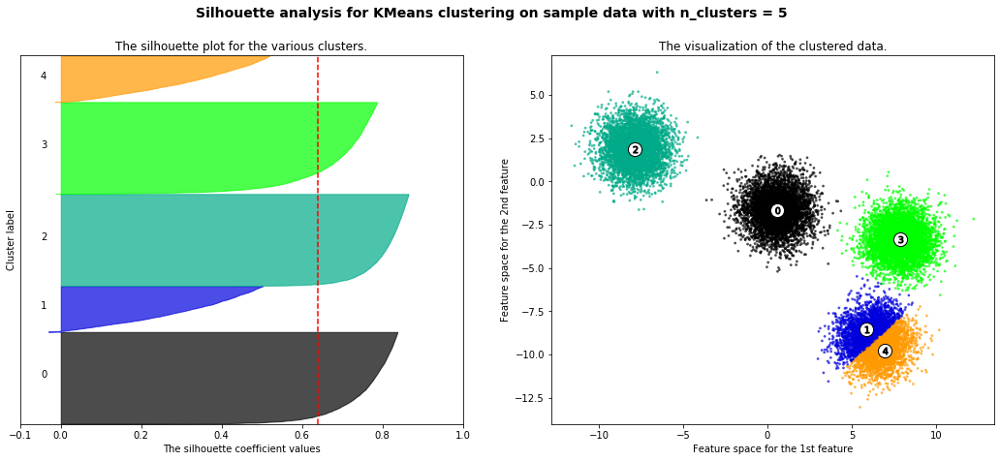





For n_clusters = 2 The average silhouette_score is : 0.5858845991765833


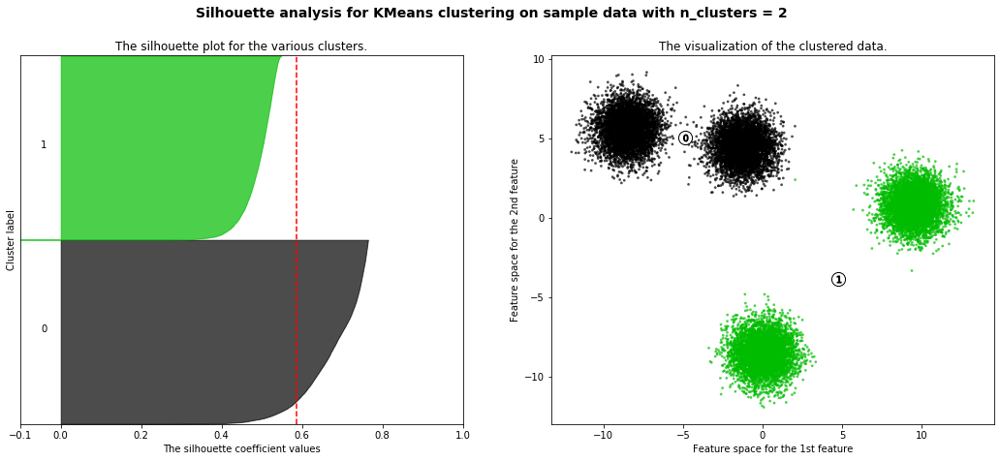

For n_clusters = 3 The average silhouette_score is : 0.7609758449176629


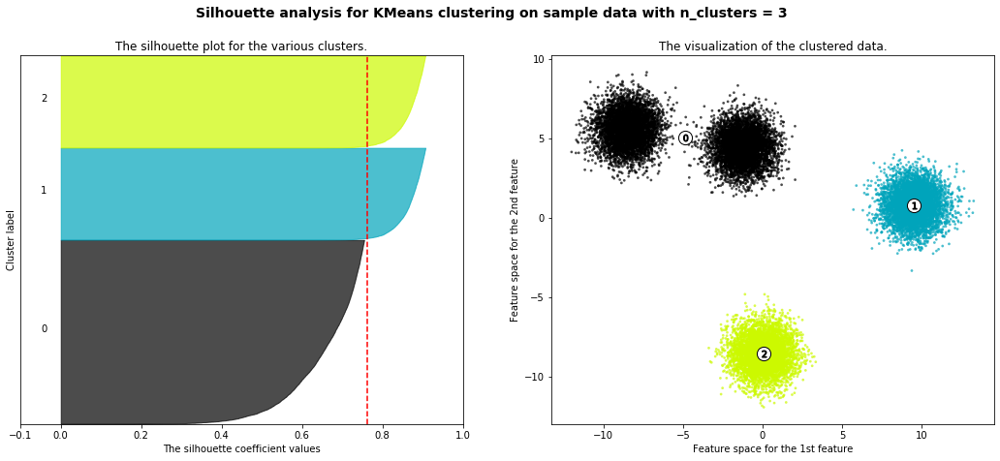

For n_clusters = 4 The average silhouette_score is : 0.8067192449425528


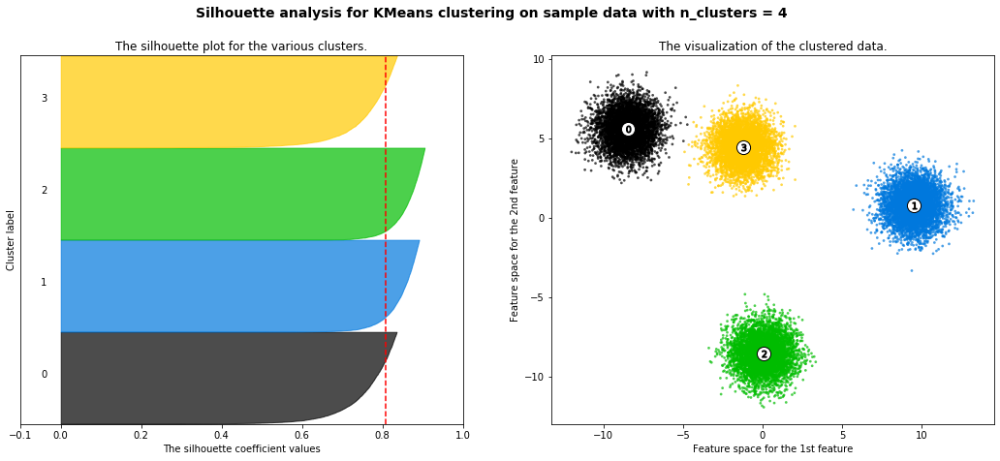

For n_clusters = 5 The average silhouette_score is : 0.6688974363682256


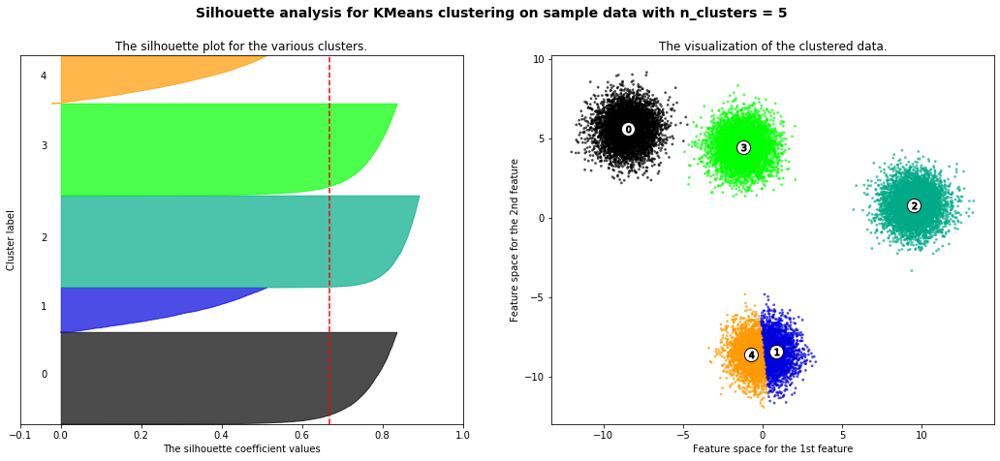





For n_clusters = 2 The average silhouette_score is : 0.6444242037225949


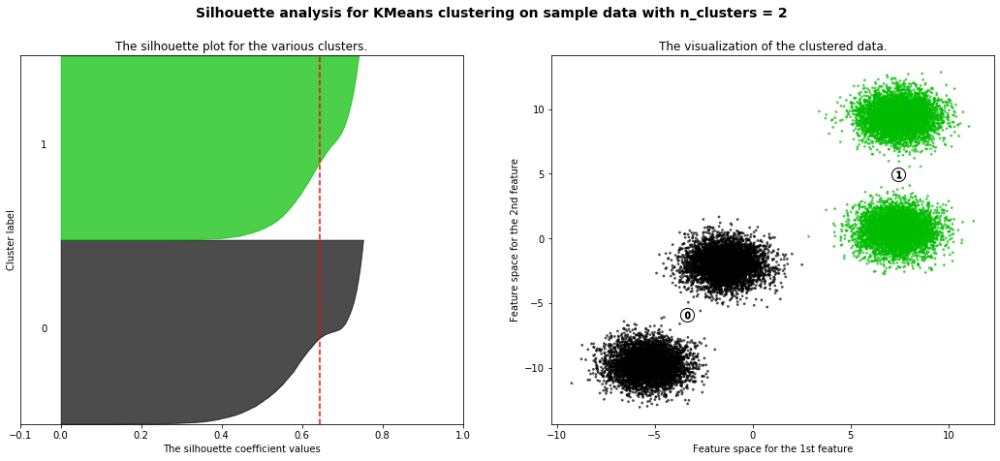

For n_clusters = 3 The average silhouette_score is : 0.6708664435774115


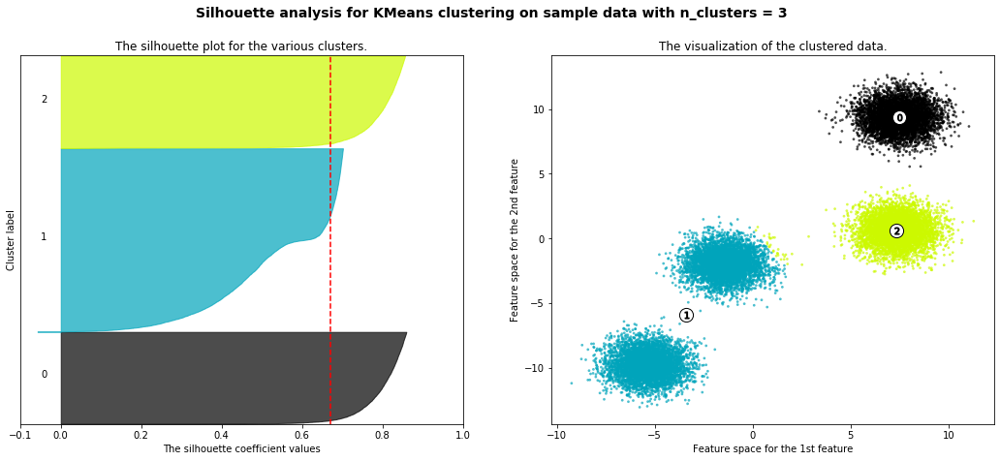

For n_clusters = 4 The average silhouette_score is : 0.7900955969454339


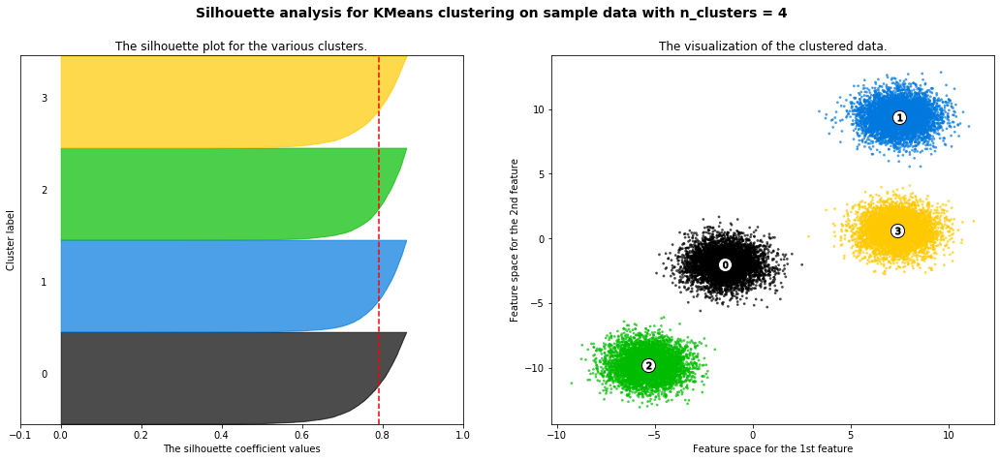

For n_clusters = 5 The average silhouette_score is : 0.6655799440032282


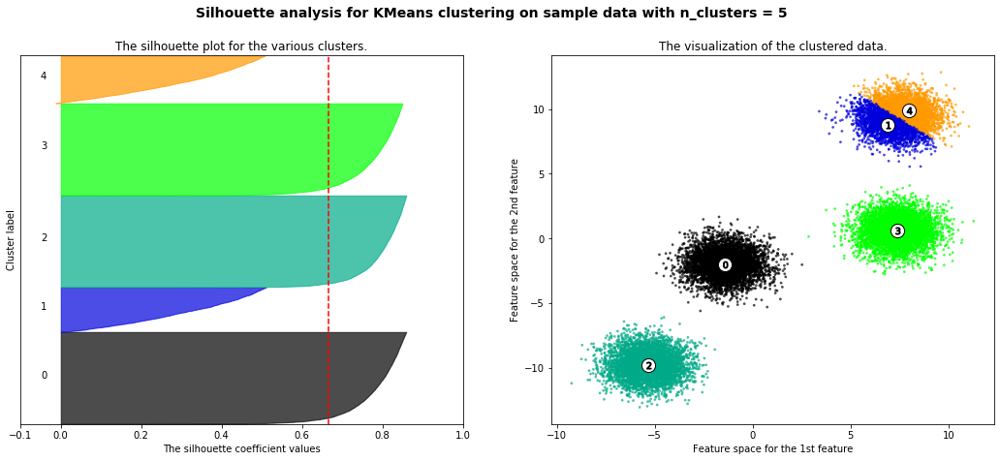





For n_clusters = 2 The average silhouette_score is : 0.6028761428134904


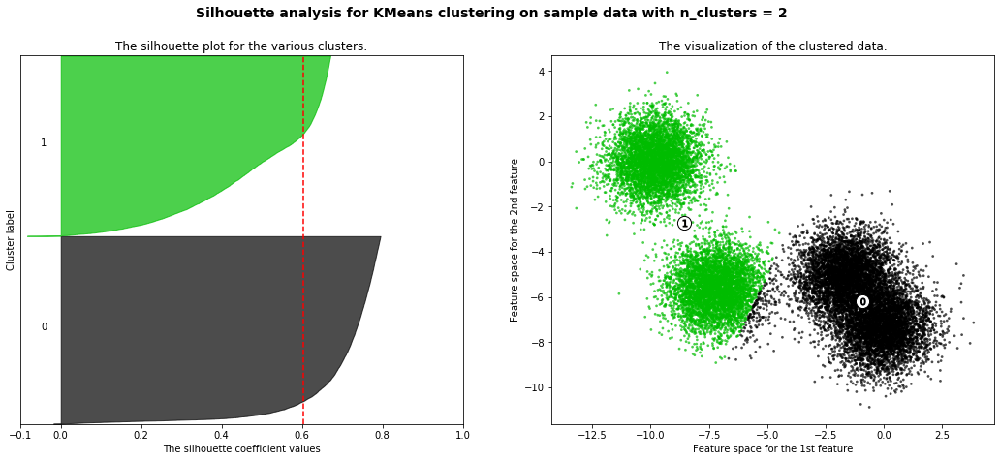

For n_clusters = 3 The average silhouette_score is : 0.6561695313990473


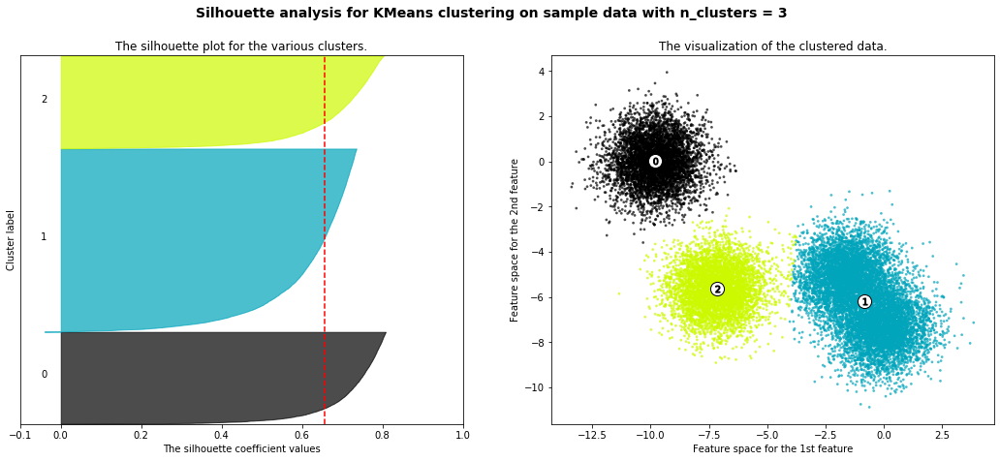

For n_clusters = 4 The average silhouette_score is : 0.5744175988233224


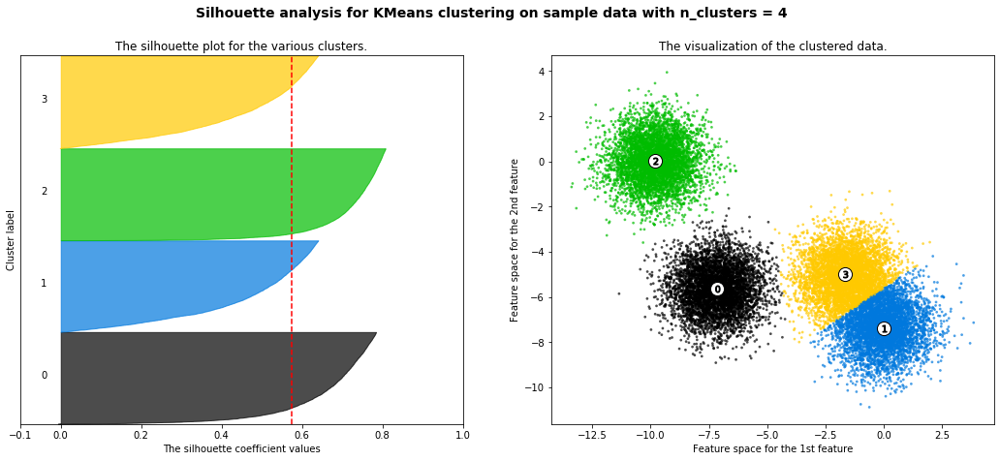

For n_clusters = 5 The average silhouette_score is : 0.5023692823196959


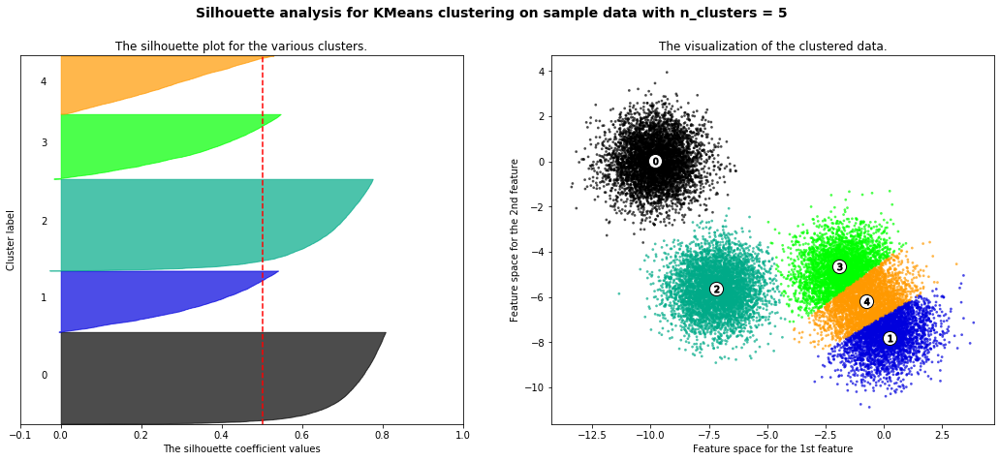





For n_clusters = 2 The average silhouette_score is : 0.651818730439123


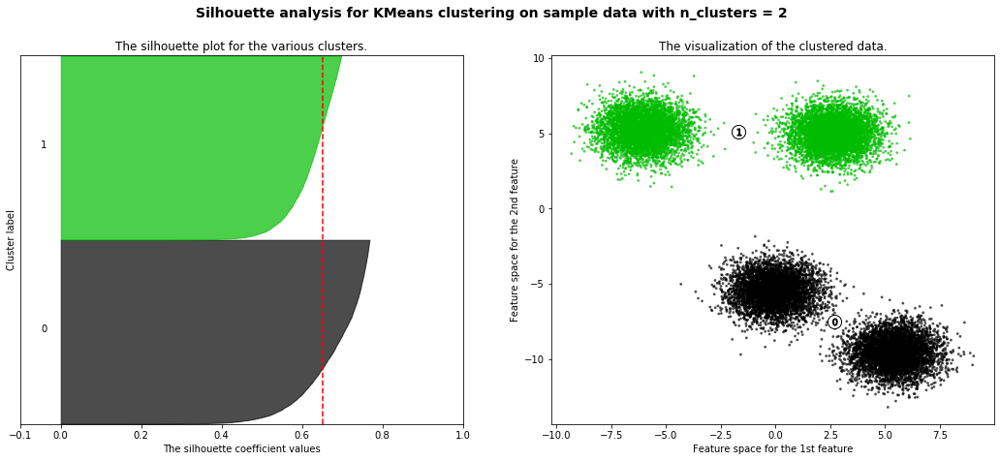

For n_clusters = 3 The average silhouette_score is : 0.7225771074568671


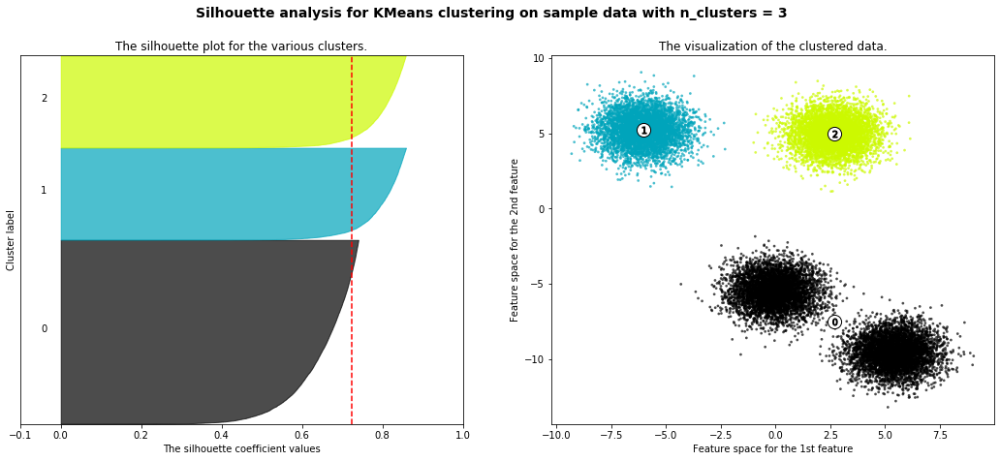

For n_clusters = 4 The average silhouette_score is : 0.7678566002434922


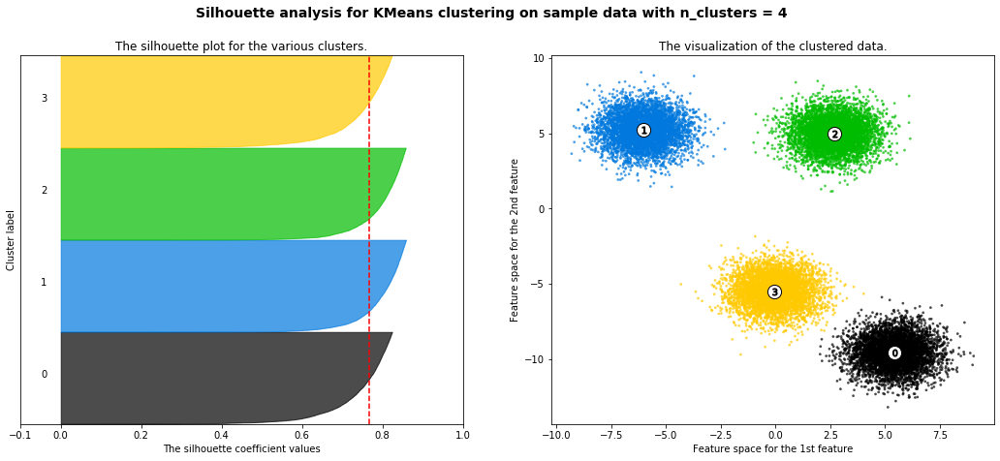

For n_clusters = 5 The average silhouette_score is : 0.6403650636180636


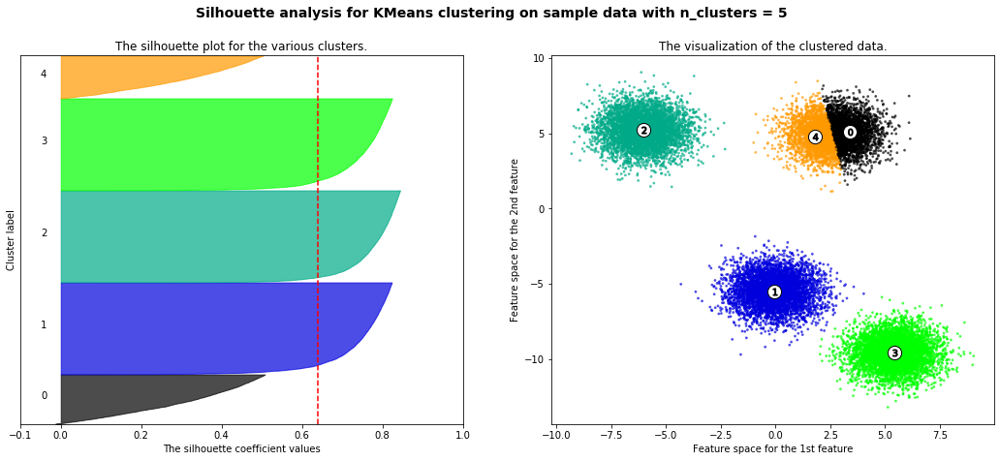





For n_clusters = 2 The average silhouette_score is : 0.565203190307111


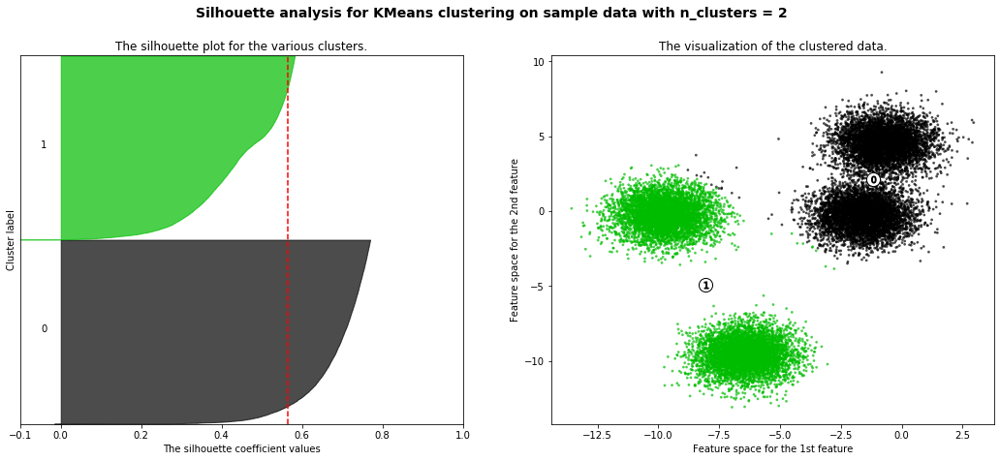

For n_clusters = 3 The average silhouette_score is : 0.7159840514380463


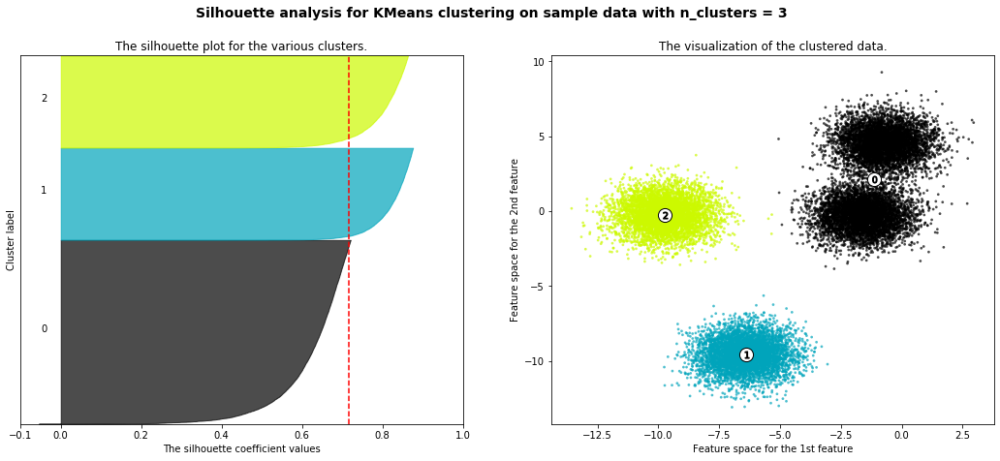

For n_clusters = 4 The average silhouette_score is : 0.7198116982251404


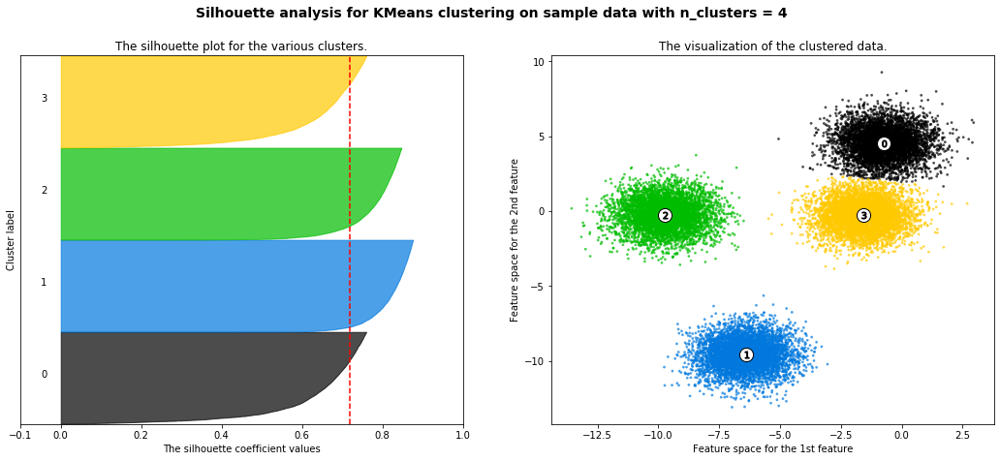

For n_clusters = 5 The average silhouette_score is : 0.6173105335001592


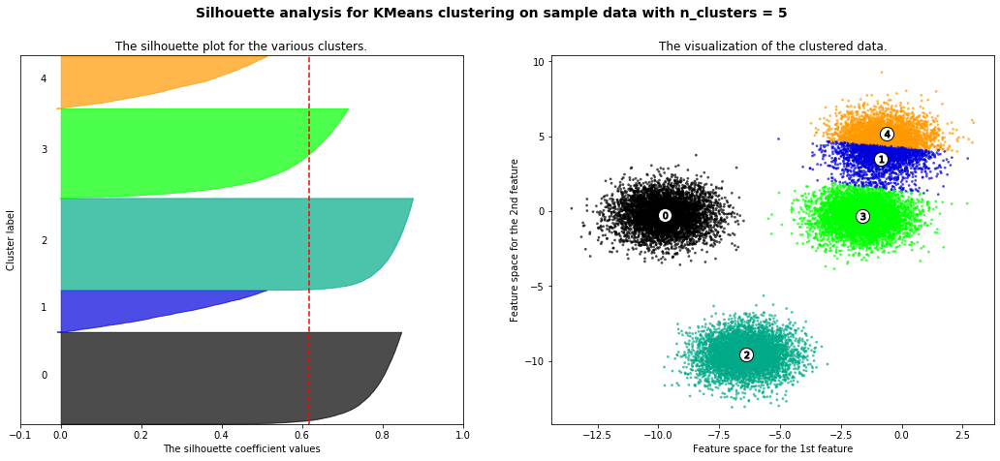





For n_clusters = 2 The average silhouette_score is : 0.7977747262795231


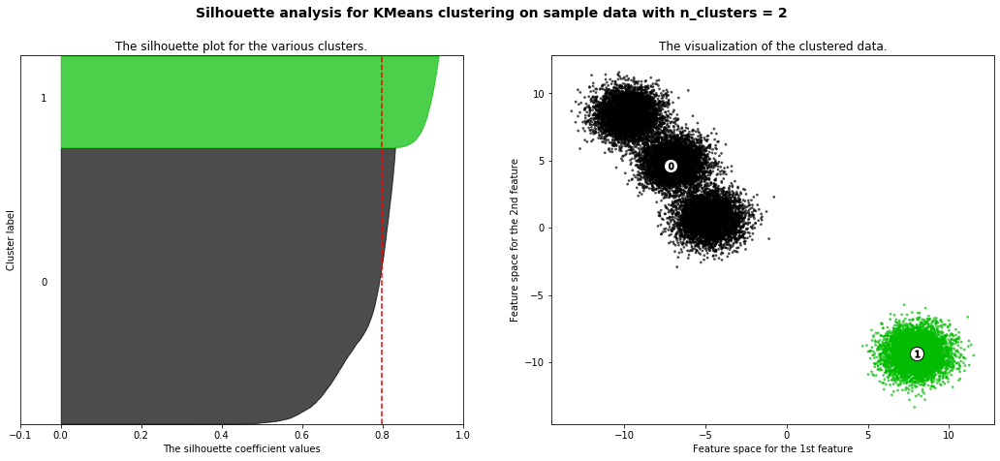

For n_clusters = 3 The average silhouette_score is : 0.6362942354860511


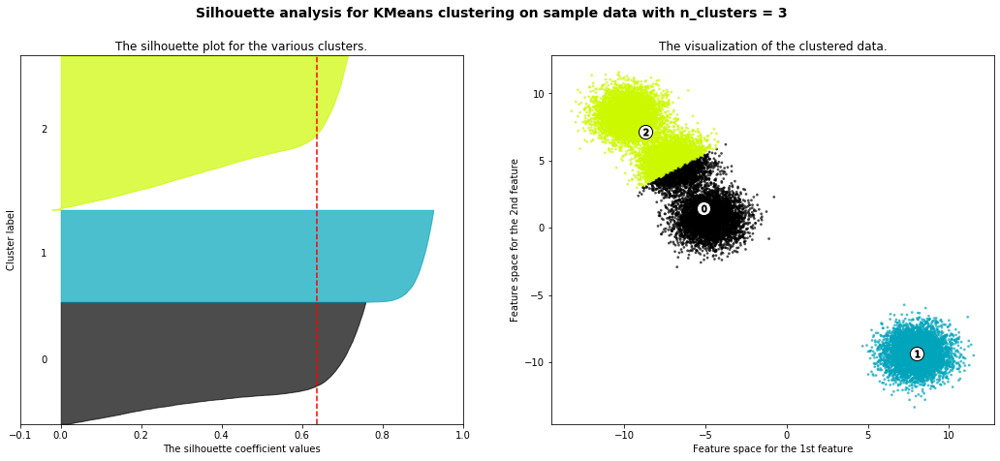

For n_clusters = 4 The average silhouette_score is : 0.6722764323382575


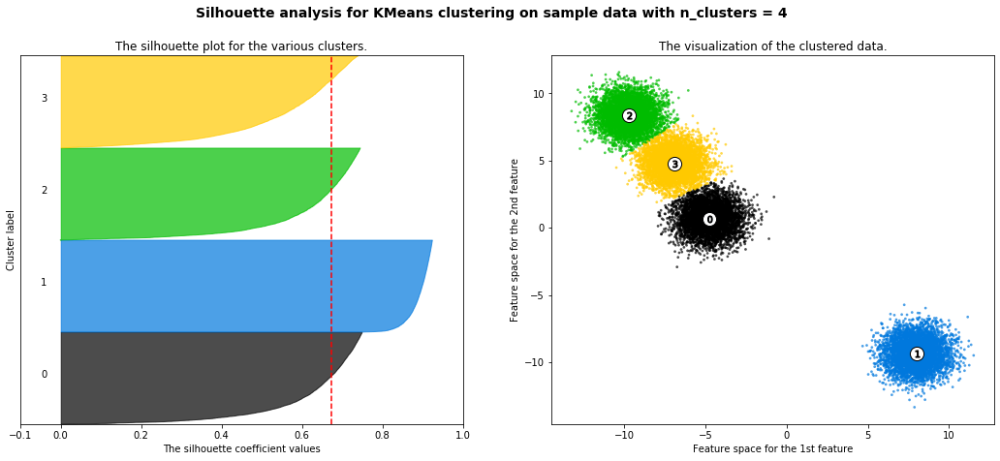

For n_clusters = 5 The average silhouette_score is : 0.5729781352370176


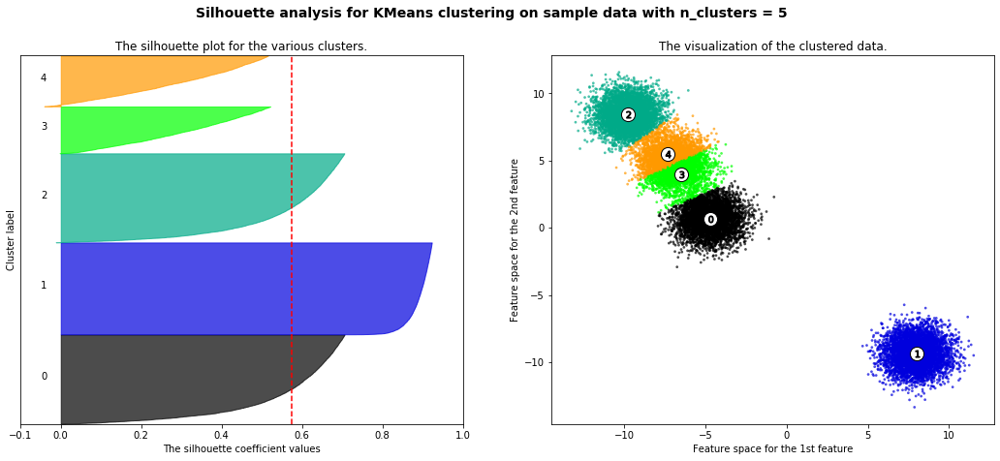





For n_clusters = 2 The average silhouette_score is : 0.663692750477994


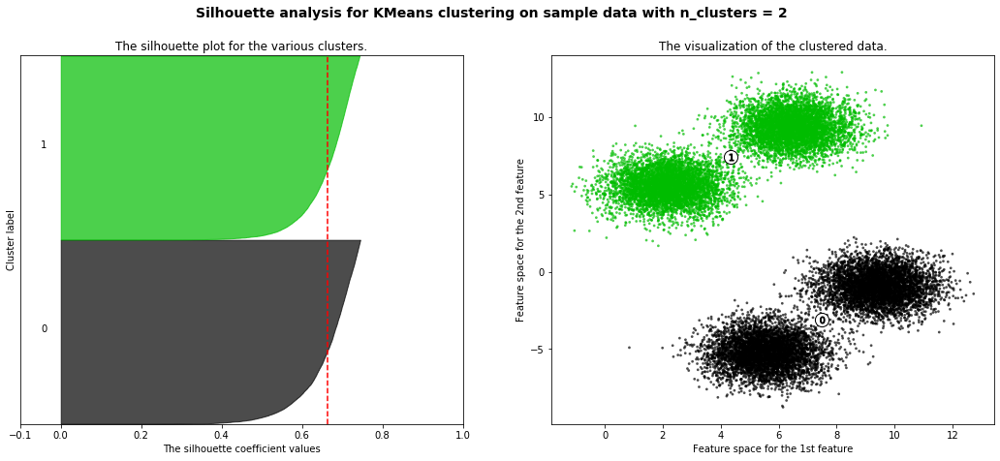

For n_clusters = 3 The average silhouette_score is : 0.6585508403850369


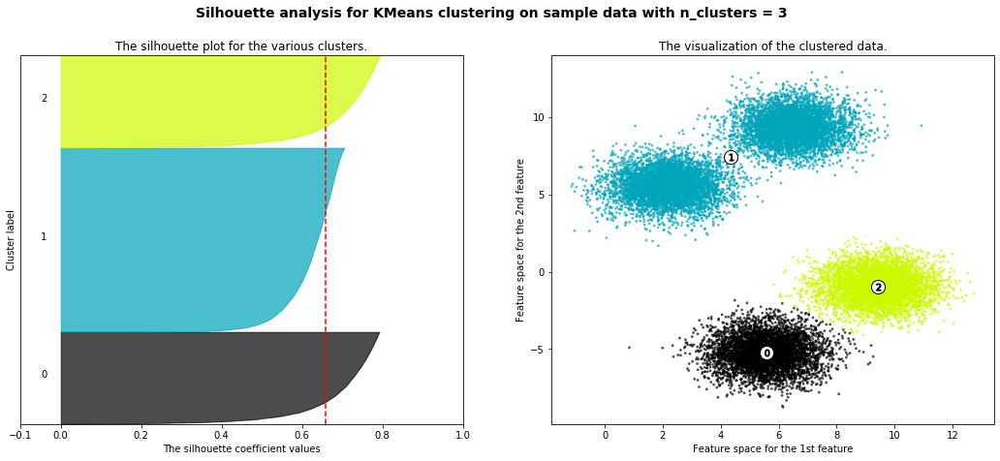

For n_clusters = 4 The average silhouette_score is : 0.6937584530252994


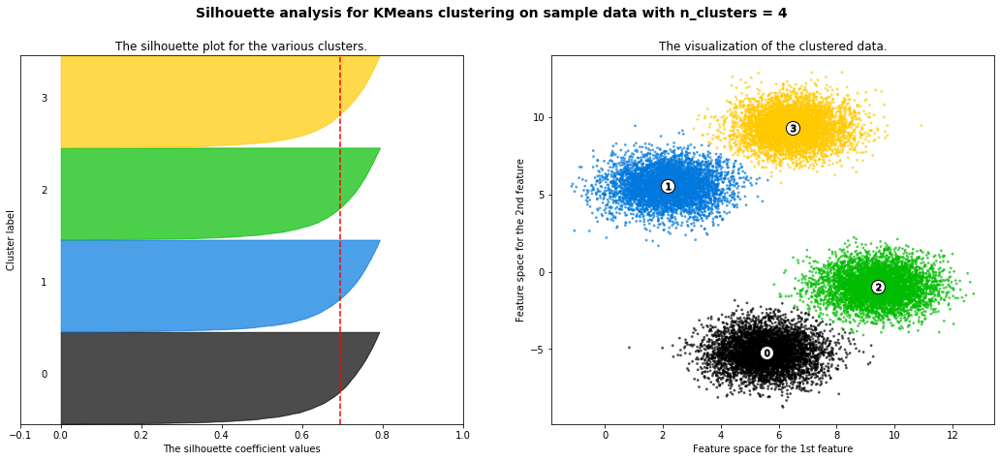

For n_clusters = 5 The average silhouette_score is : 0.5863036863660501


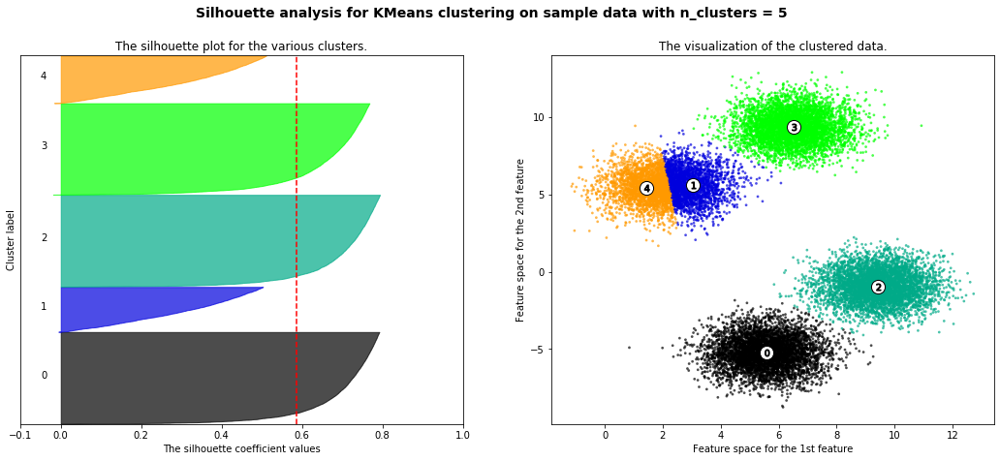





For n_clusters = 2 The average silhouette_score is : 0.6766860058186396


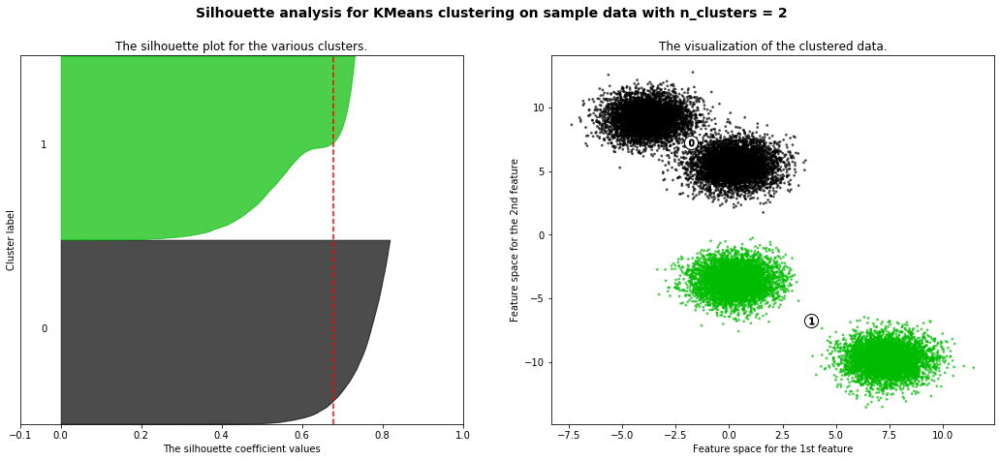

For n_clusters = 3 The average silhouette_score is : 0.7333860333139474


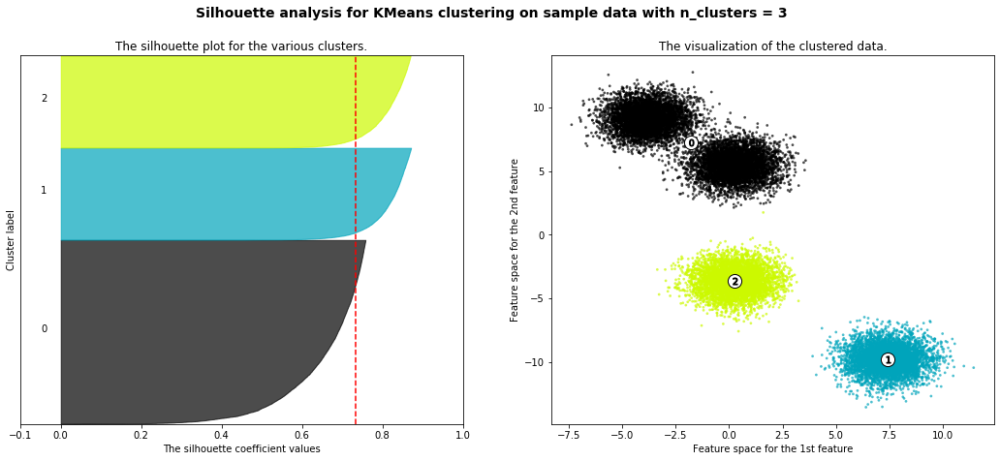

For n_clusters = 4 The average silhouette_score is : 0.7389744618782522


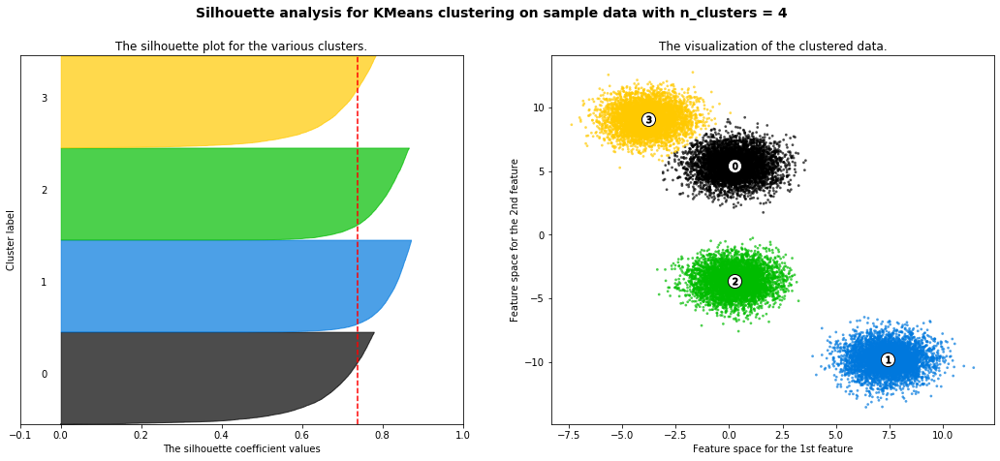

For n_clusters = 5 The average silhouette_score is : 0.6328918804191107


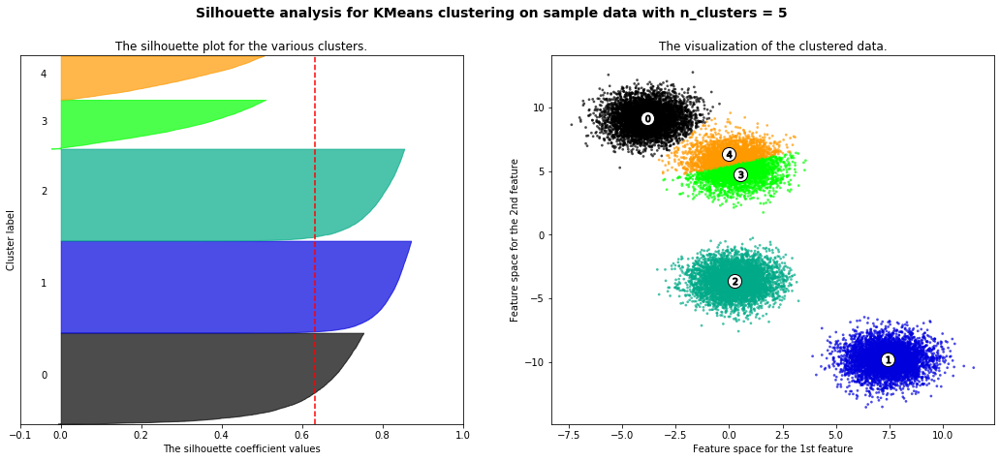





For n_clusters = 2 The average silhouette_score is : 0.7351885318643768


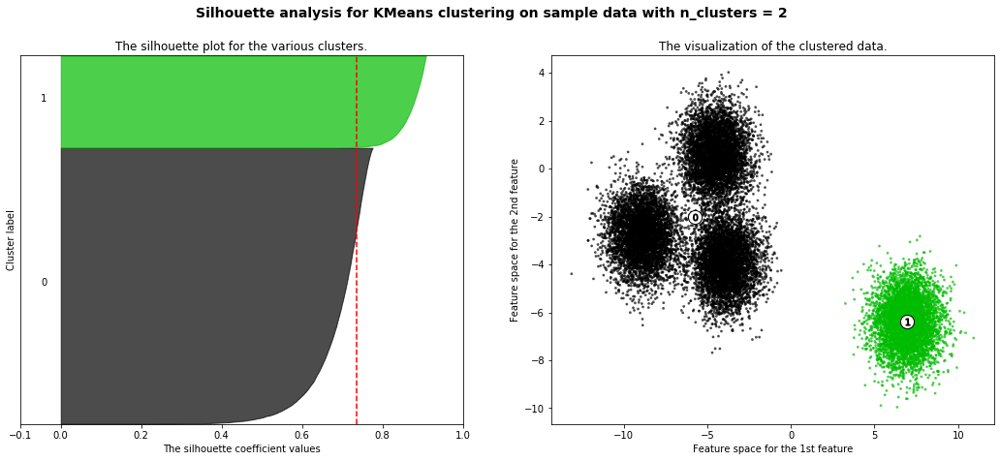

For n_clusters = 3 The average silhouette_score is : 0.5788241665764692


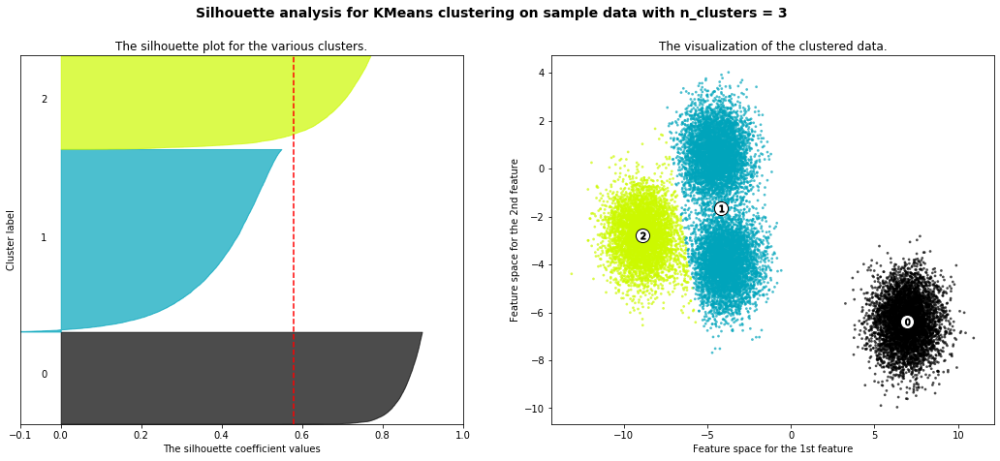

For n_clusters = 4 The average silhouette_score is : 0.6714860683689061


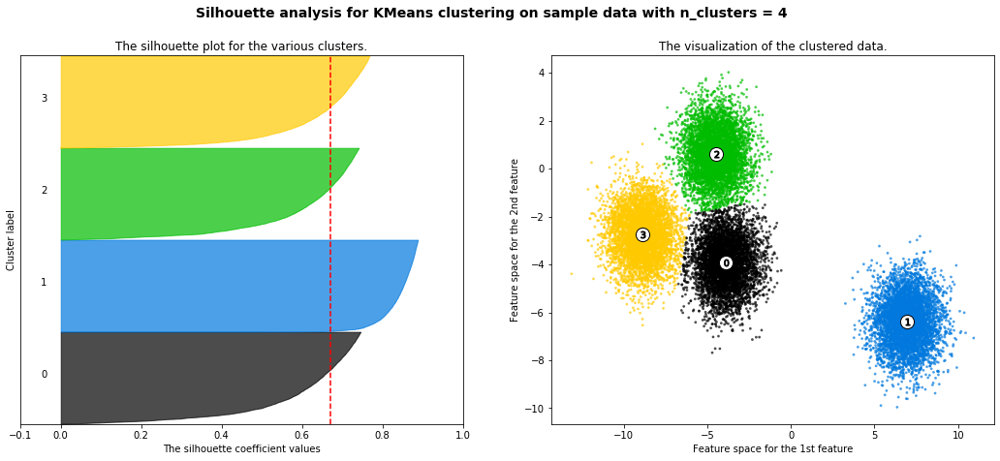

For n_clusters = 5 The average silhouette_score is : 0.5784448380343203


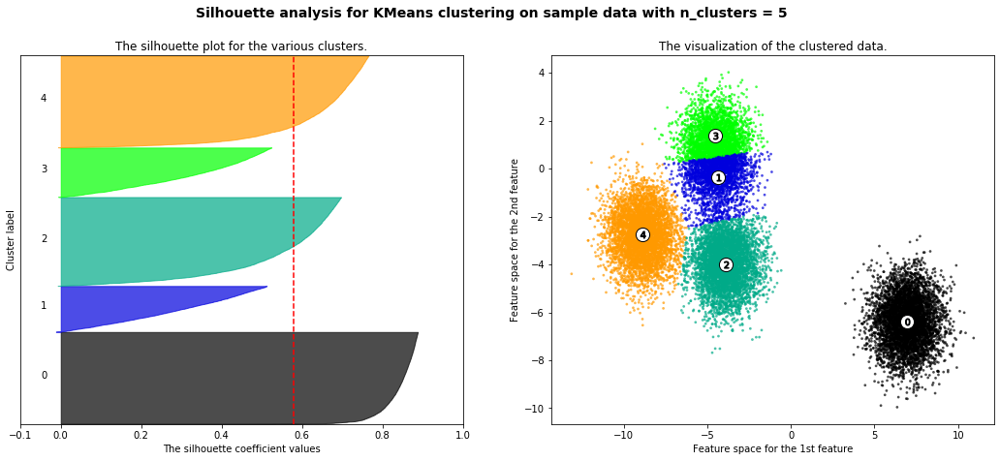





For n_clusters = 2 The average silhouette_score is : 0.5655483467540878


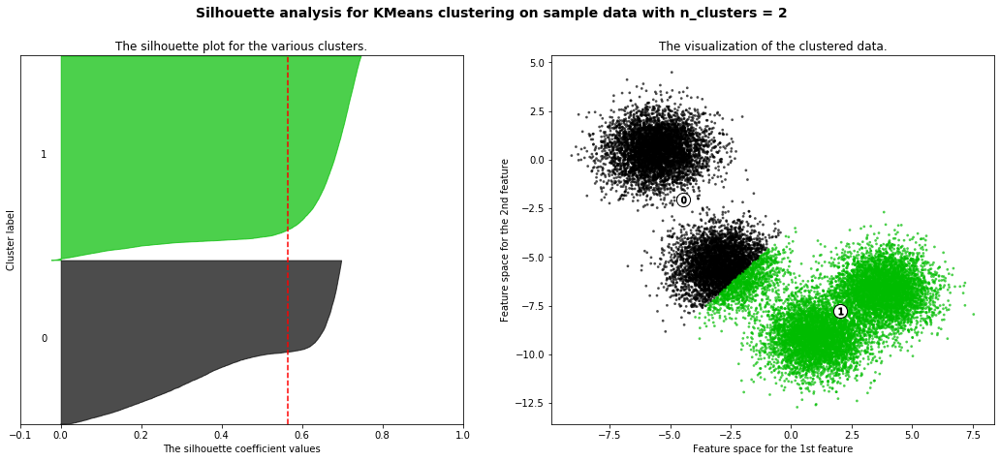

For n_clusters = 3 The average silhouette_score is : 0.6113487229087335


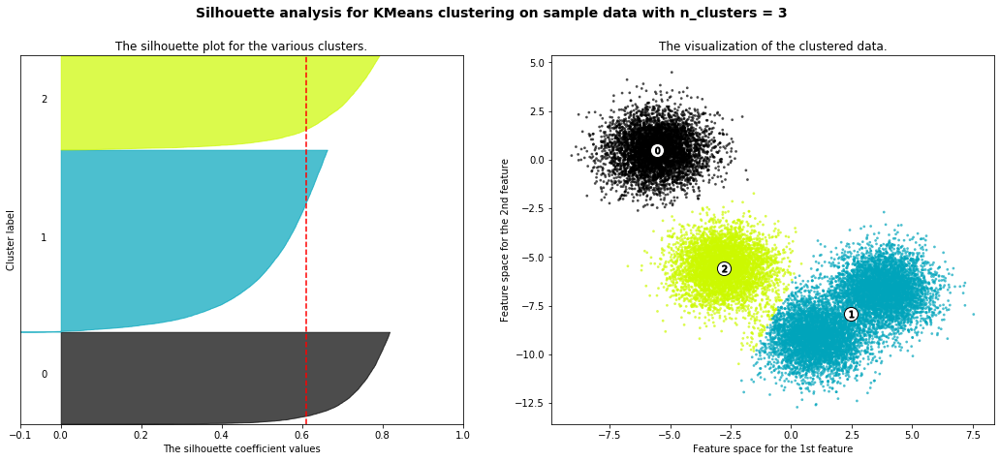

For n_clusters = 4 The average silhouette_score is : 0.6133780950975813


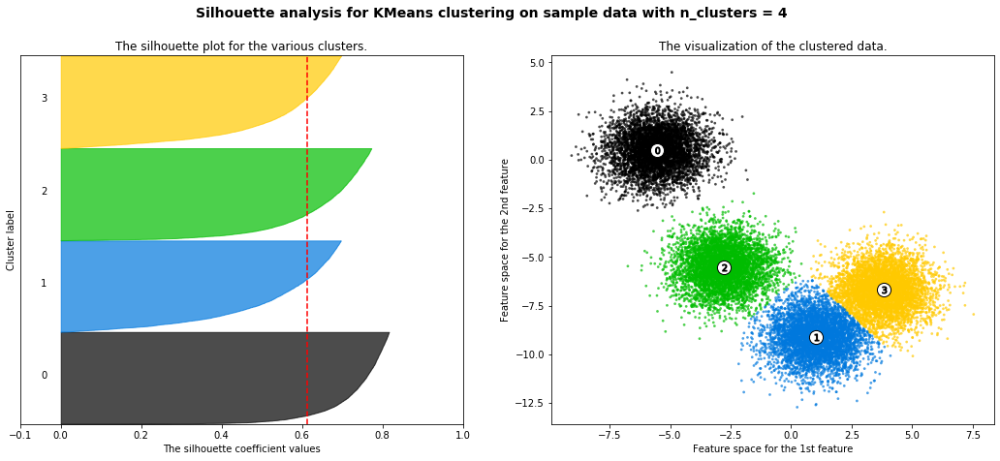

For n_clusters = 5 The average silhouette_score is : 0.5263899933831296


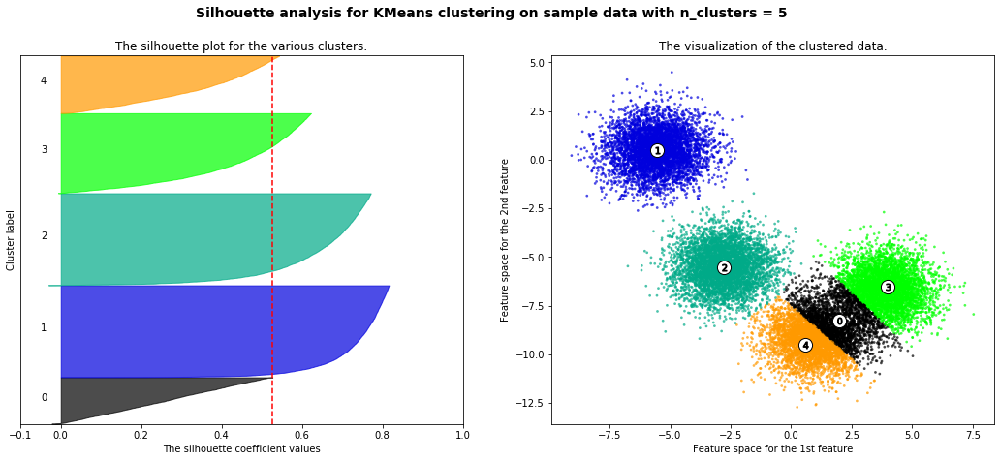





For n_clusters = 2 The average silhouette_score is : 0.6206254350446543


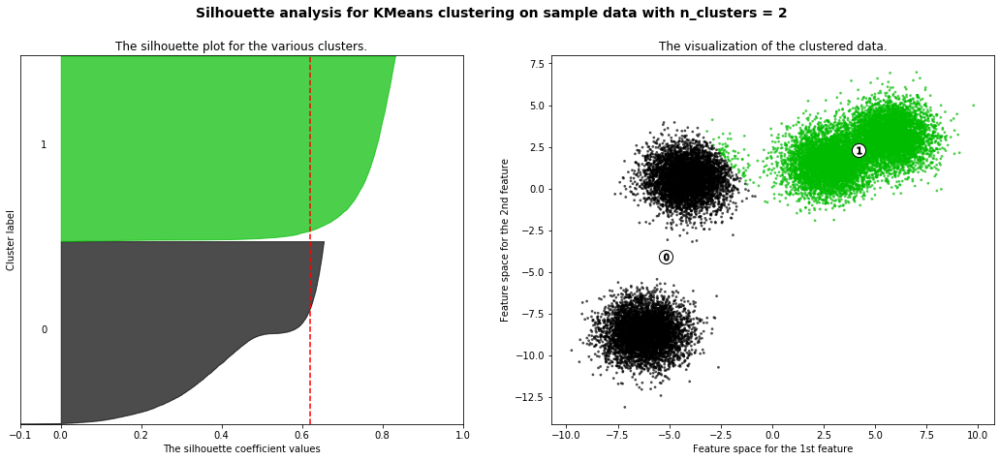

For n_clusters = 3 The average silhouette_score is : 0.7309655203884587


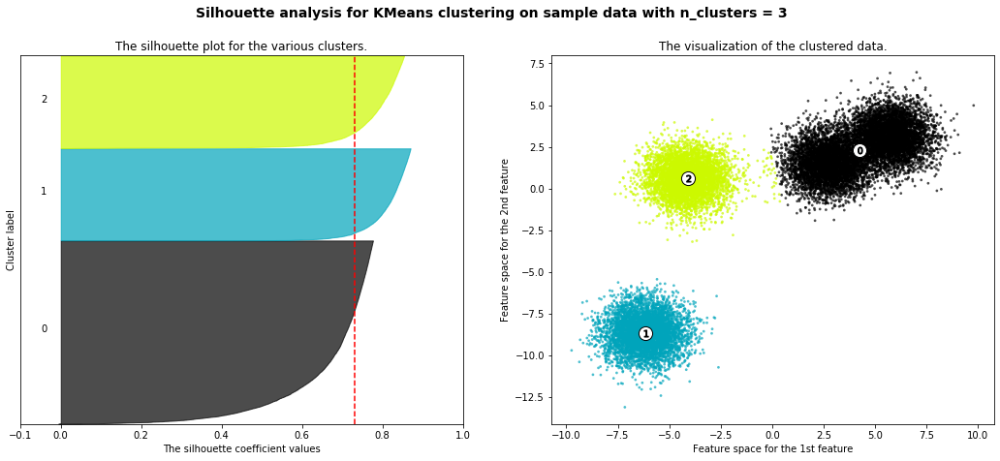

For n_clusters = 4 The average silhouette_score is : 0.645983343836734


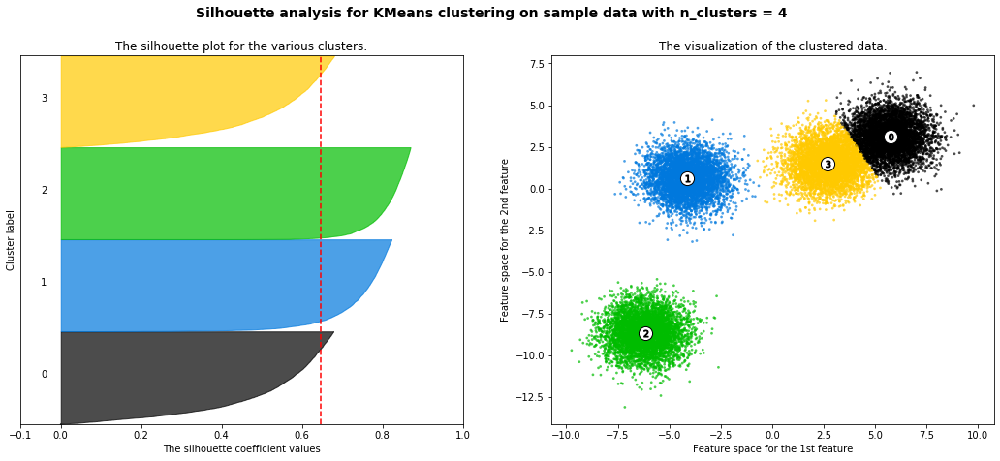

For n_clusters = 5 The average silhouette_score is : 0.5610209365229006


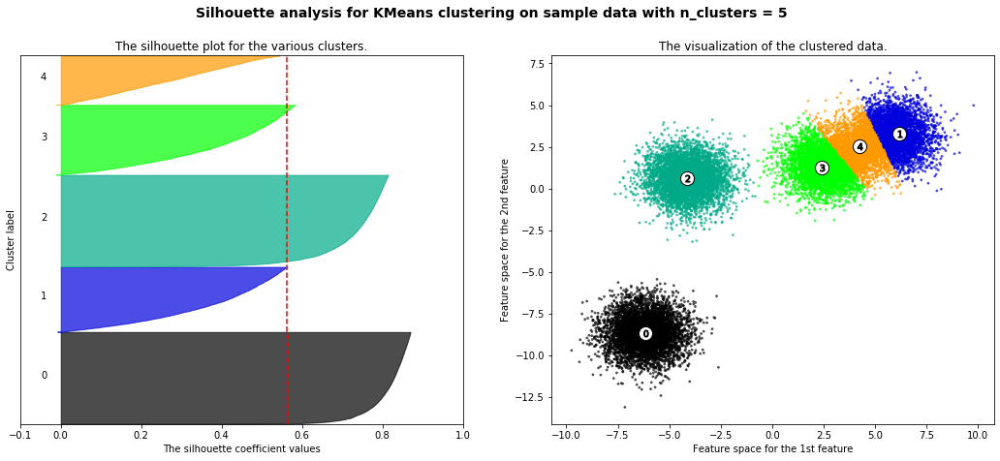





For n_clusters = 2 The average silhouette_score is : 0.5702388891645838


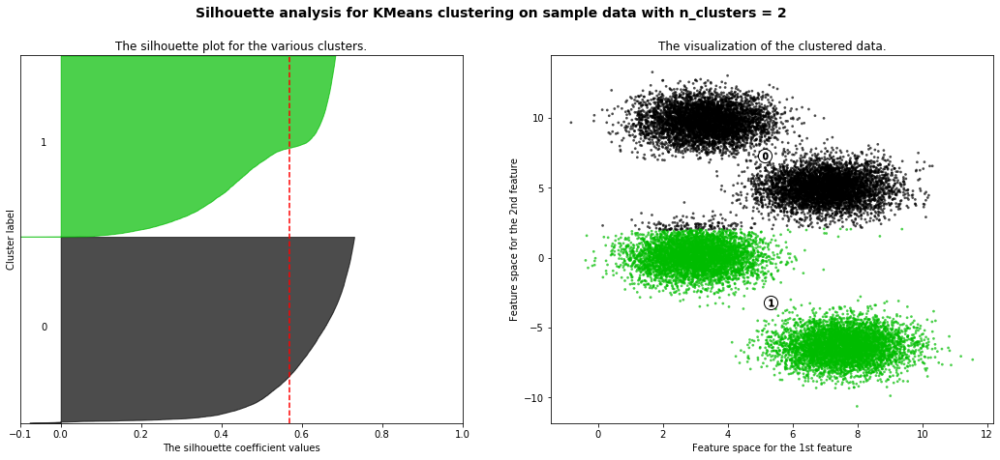

For n_clusters = 3 The average silhouette_score is : 0.6212514649542944


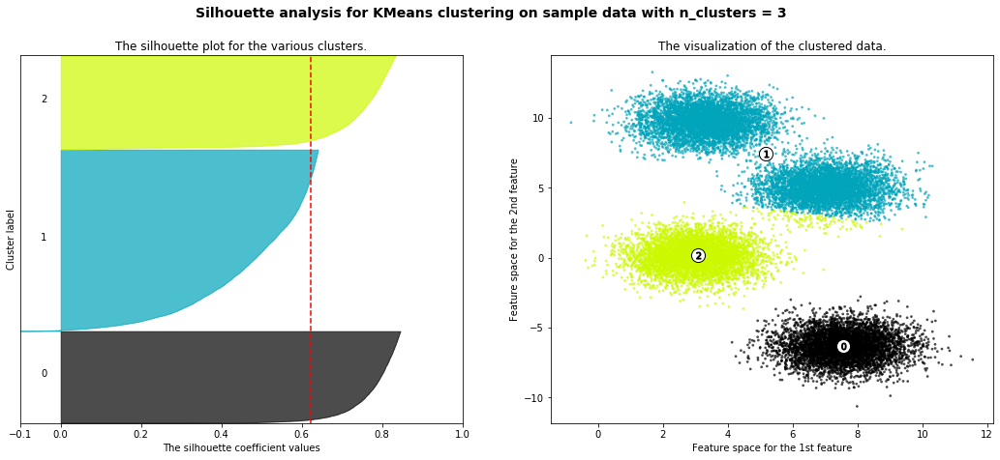

For n_clusters = 4 The average silhouette_score is : 0.7191959073425521


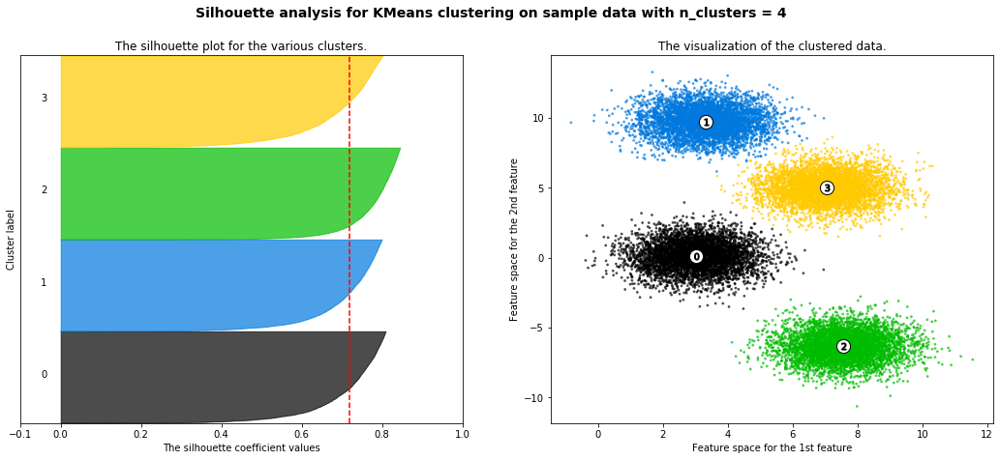

For n_clusters = 5 The average silhouette_score is : 0.6124459089449873


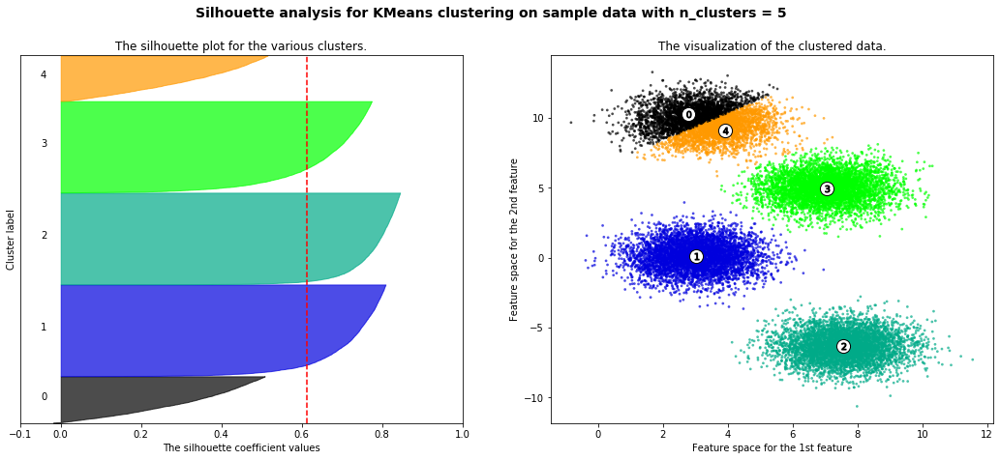





For n_clusters = 2 The average silhouette_score is : 0.698595027242619


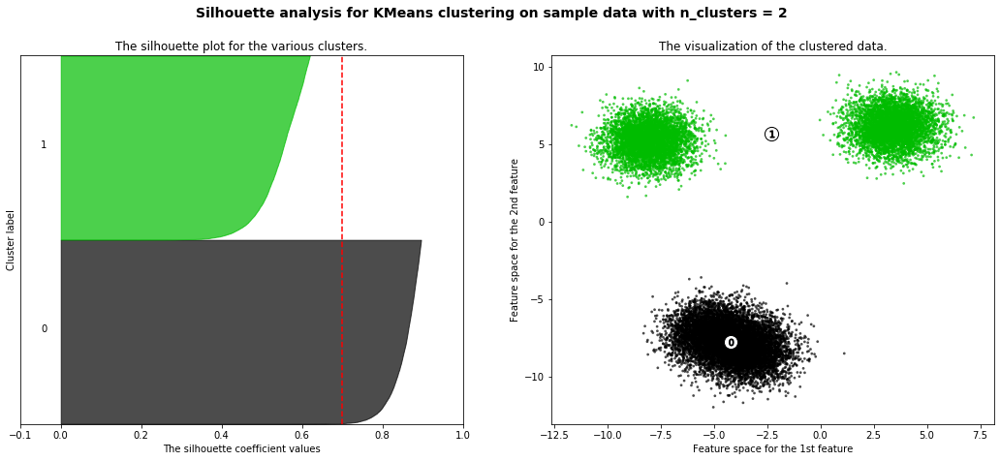

For n_clusters = 3 The average silhouette_score is : 0.842745947643593


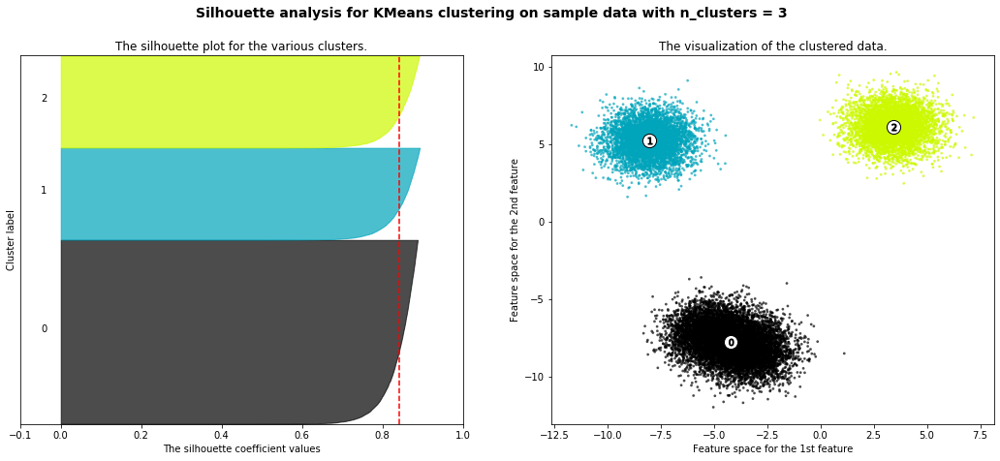

For n_clusters = 4 The average silhouette_score is : 0.6200760888382374


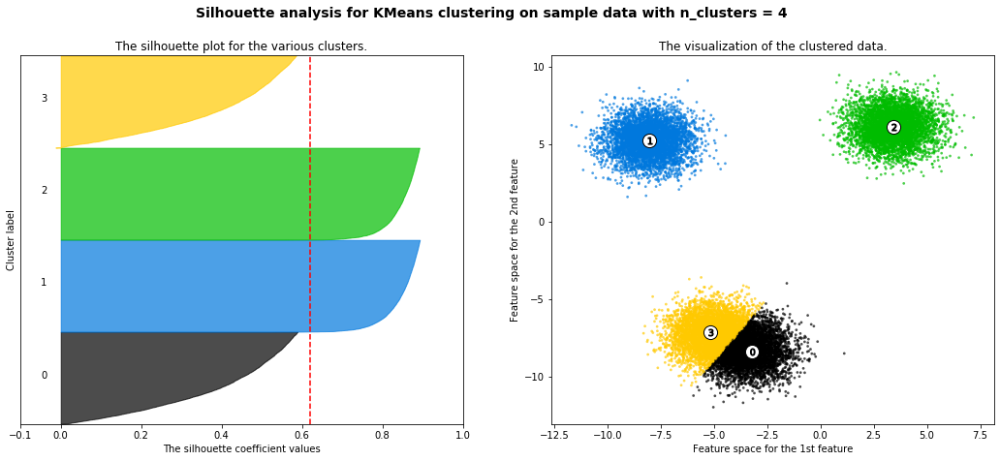

For n_clusters = 5 The average silhouette_score is : 0.5904029821857316


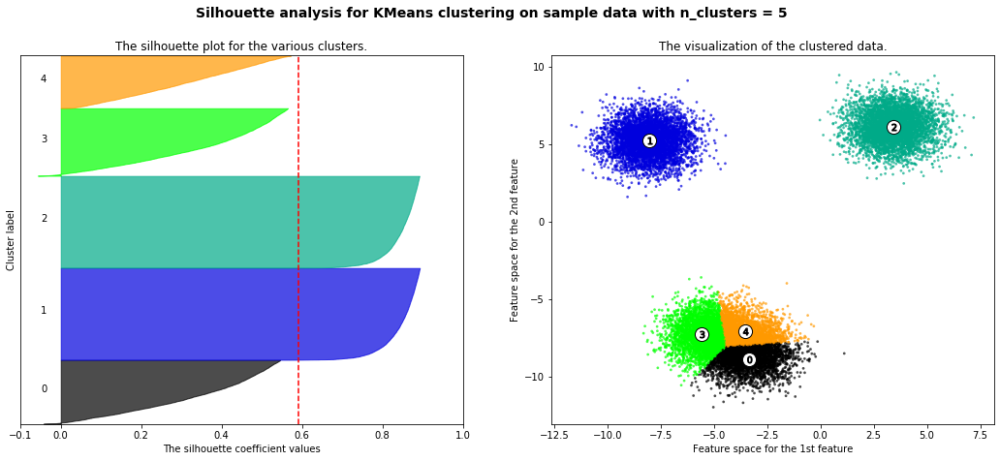





For n_clusters = 2 The average silhouette_score is : 0.6298518349494144


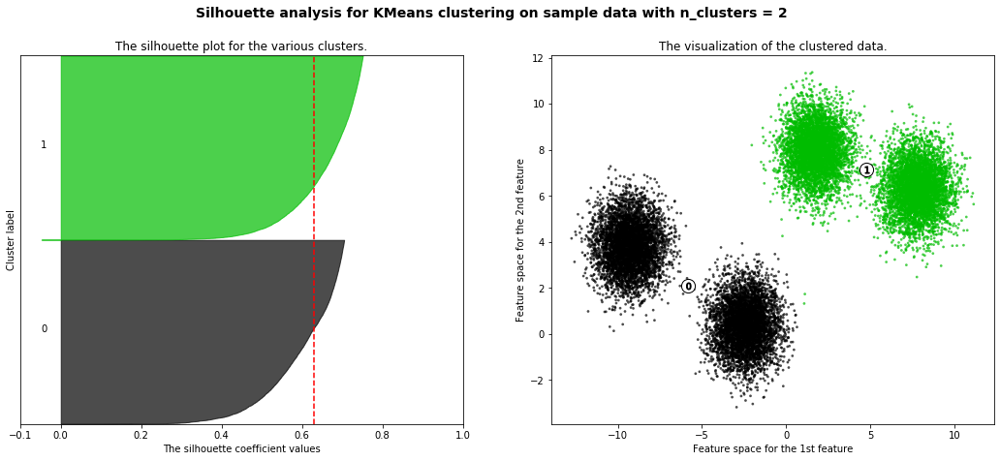

For n_clusters = 3 The average silhouette_score is : 0.6781747463717614


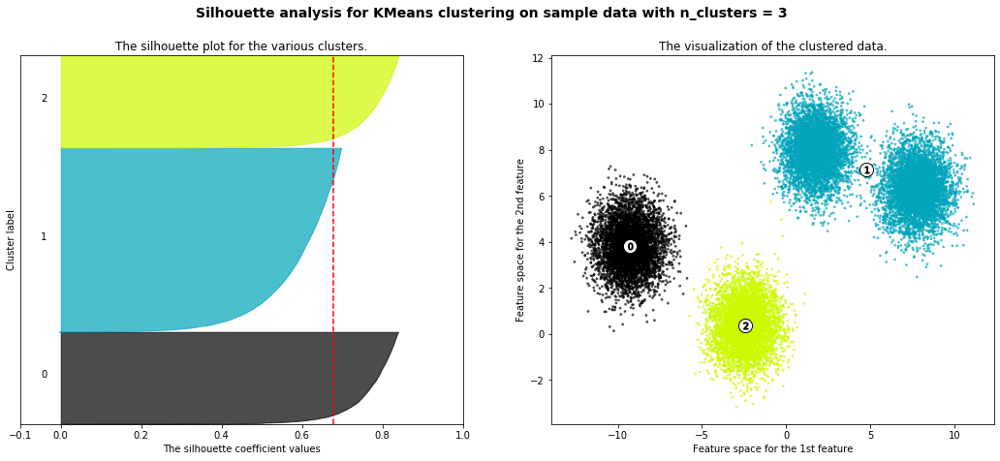

For n_clusters = 4 The average silhouette_score is : 0.7389725038099934


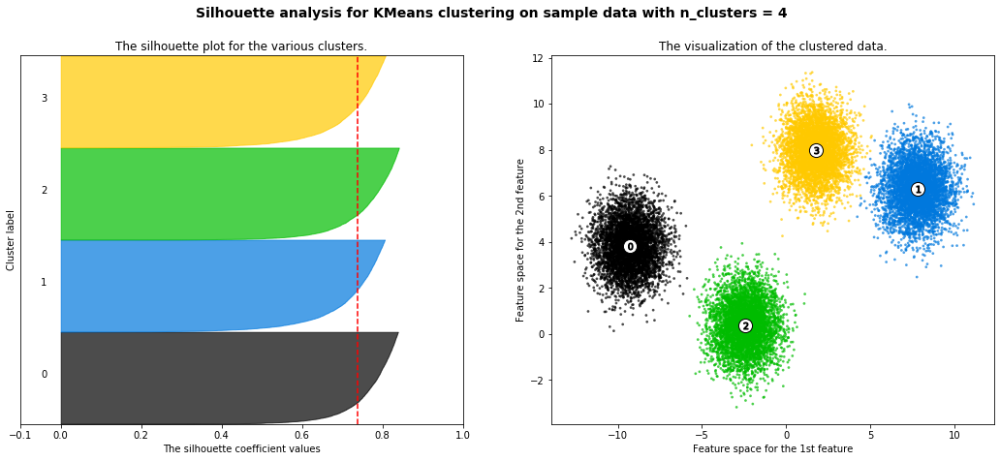

For n_clusters = 5 The average silhouette_score is : 0.6217542831395042


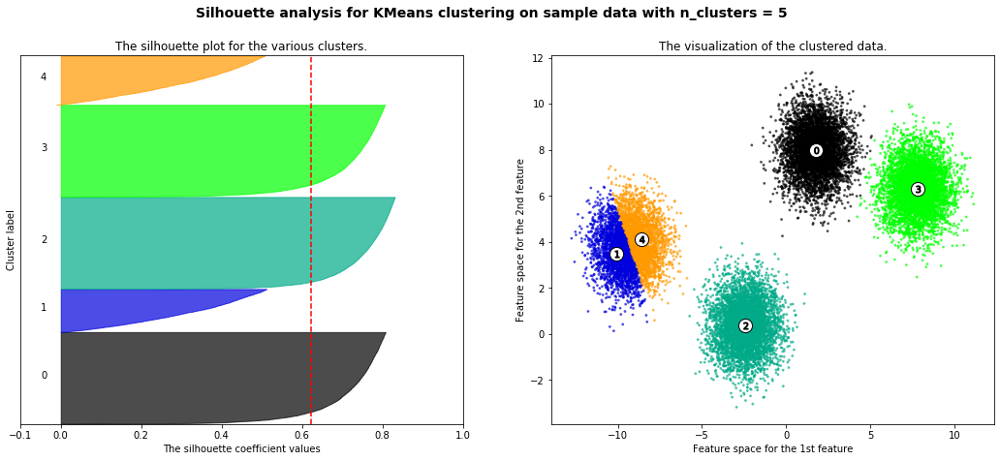





For n_clusters = 2 The average silhouette_score is : 0.5783795604668592


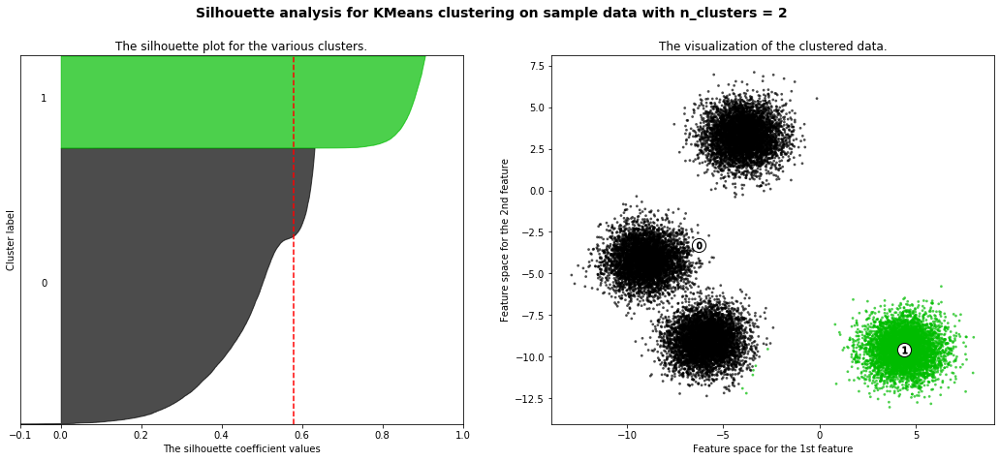

For n_clusters = 3 The average silhouette_score is : 0.7202549786044897


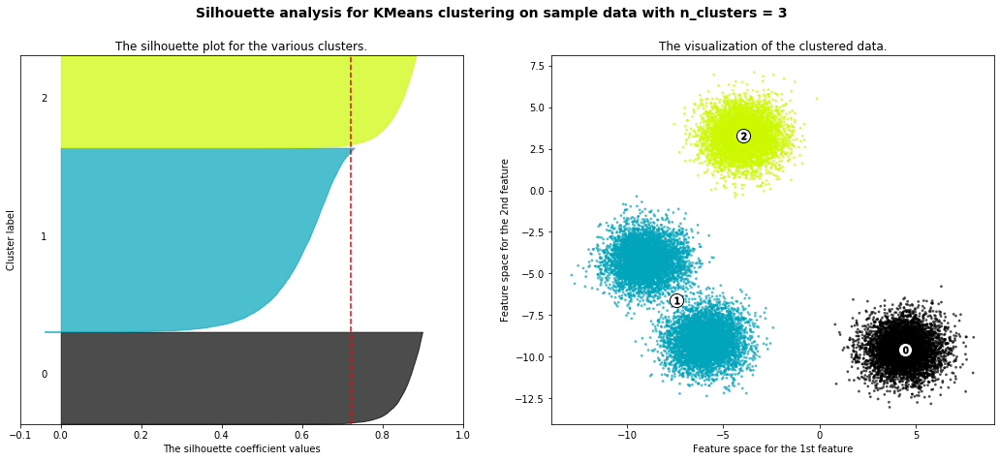

For n_clusters = 4 The average silhouette_score is : 0.7523224123896484


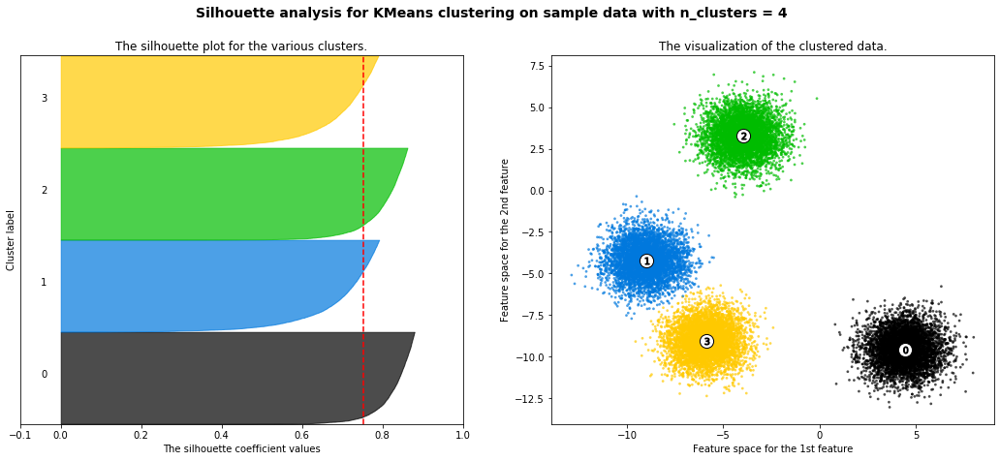

For n_clusters = 5 The average silhouette_score is : 0.6513175689176499


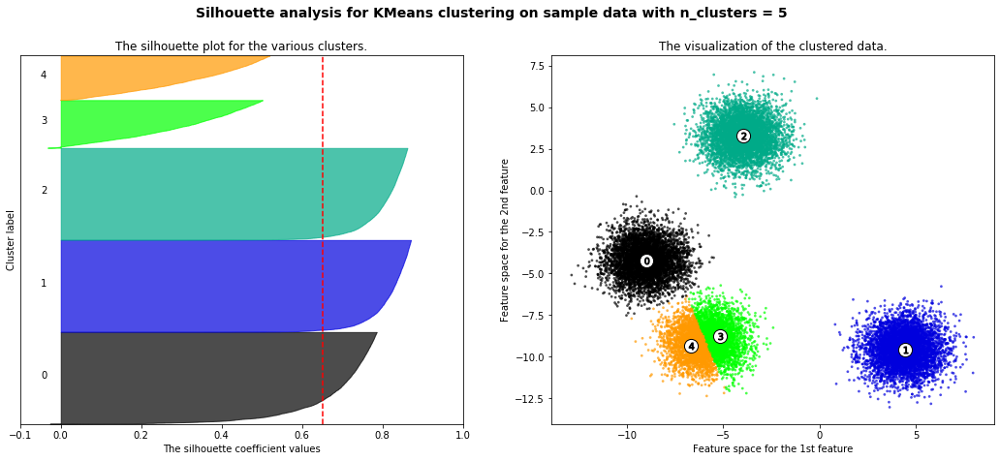





For n_clusters = 2 The average silhouette_score is : 0.6158560916329213


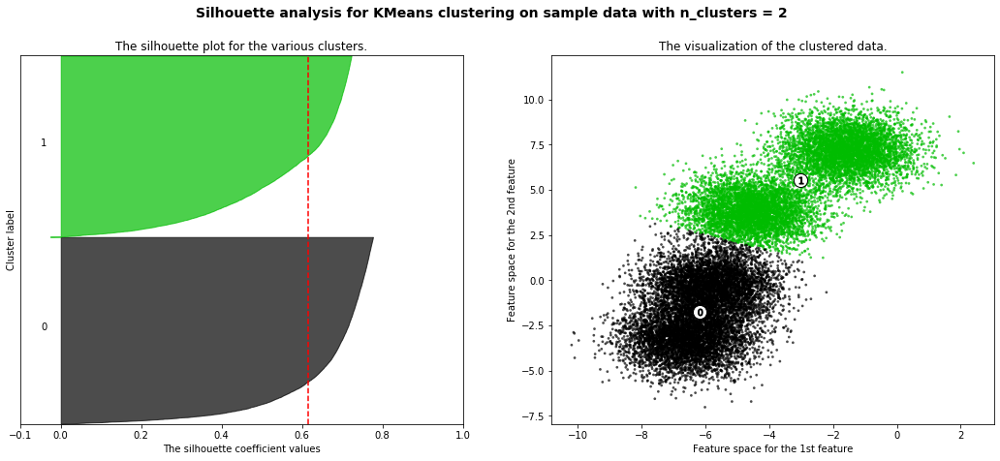

For n_clusters = 3 The average silhouette_score is : 0.5669441448245146


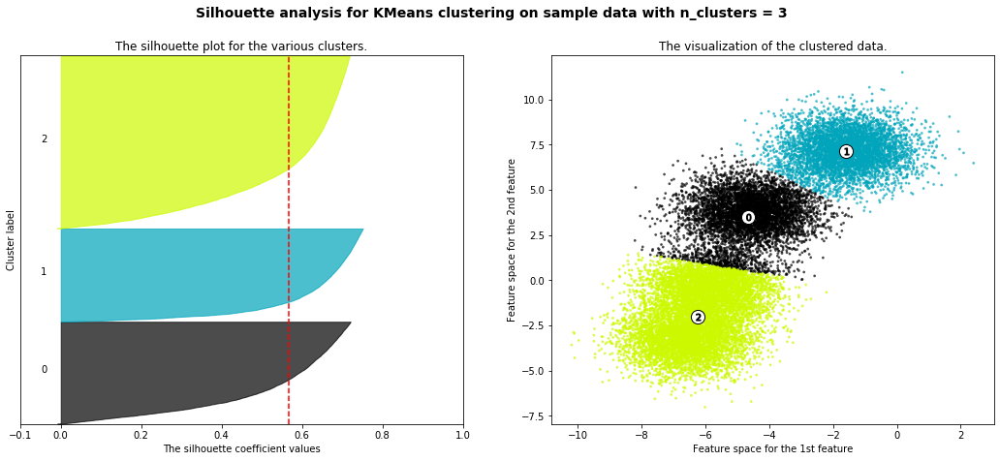

For n_clusters = 4 The average silhouette_score is : 0.5160091376453617


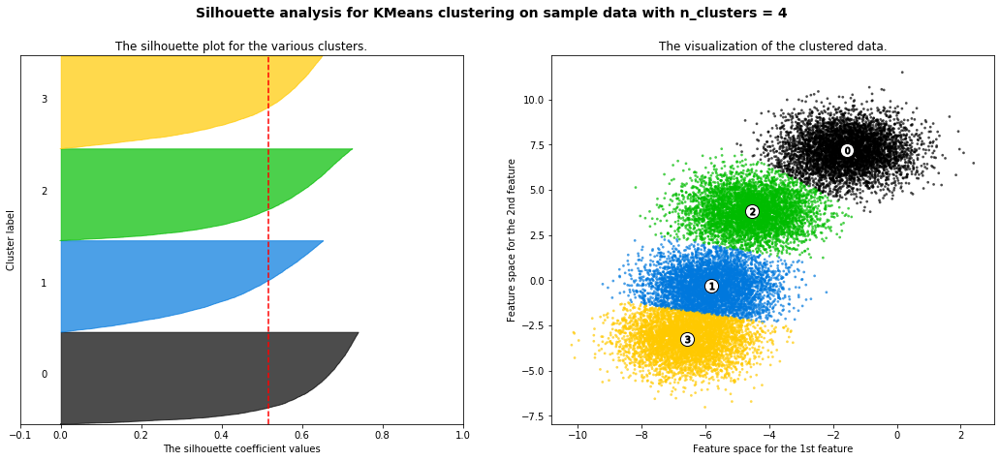

For n_clusters = 5 The average silhouette_score is : 0.4422011540627579


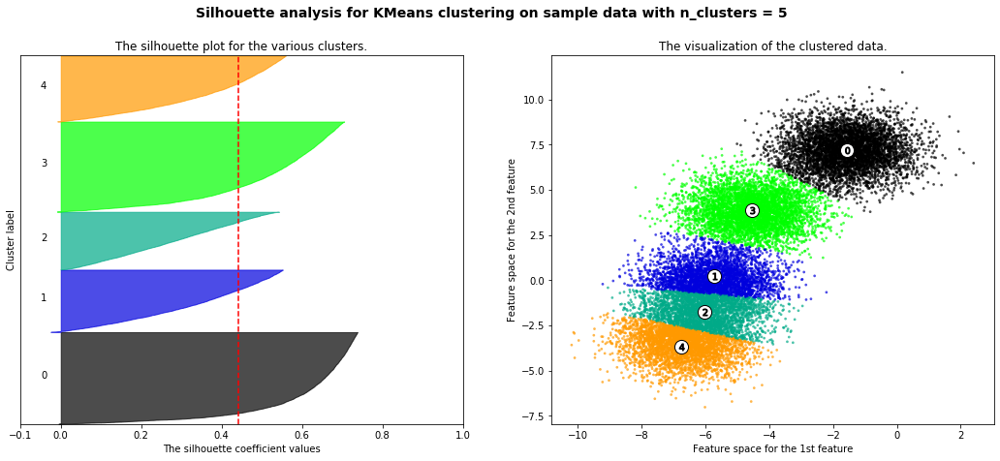





For n_clusters = 2 The average silhouette_score is : 0.5908781914956049


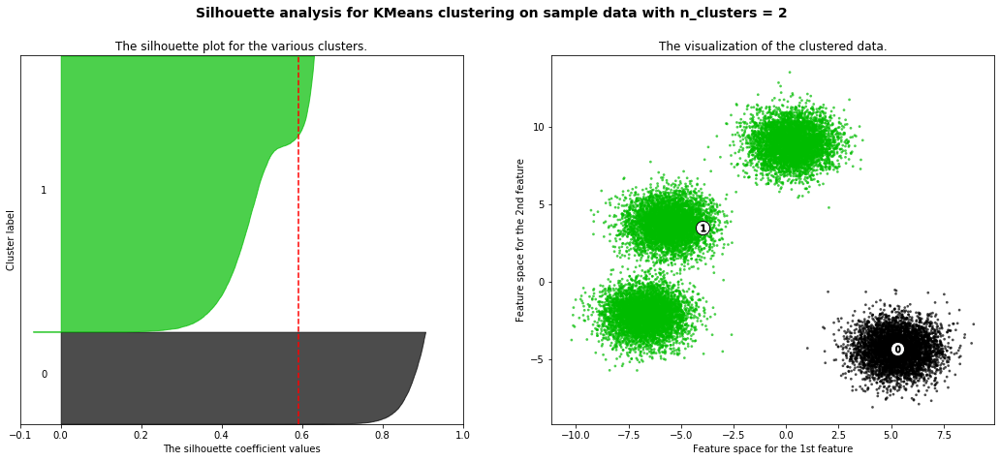

For n_clusters = 3 The average silhouette_score is : 0.7140630685330794


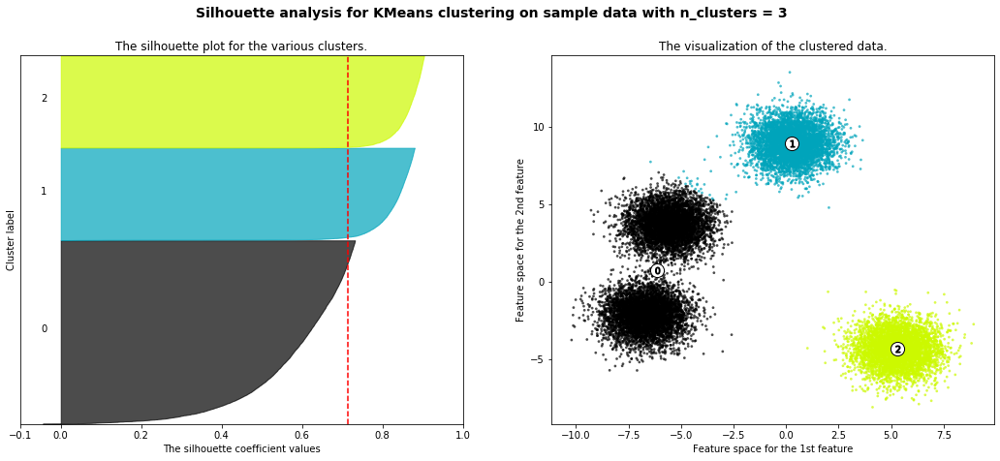

For n_clusters = 4 The average silhouette_score is : 0.7568393956708531


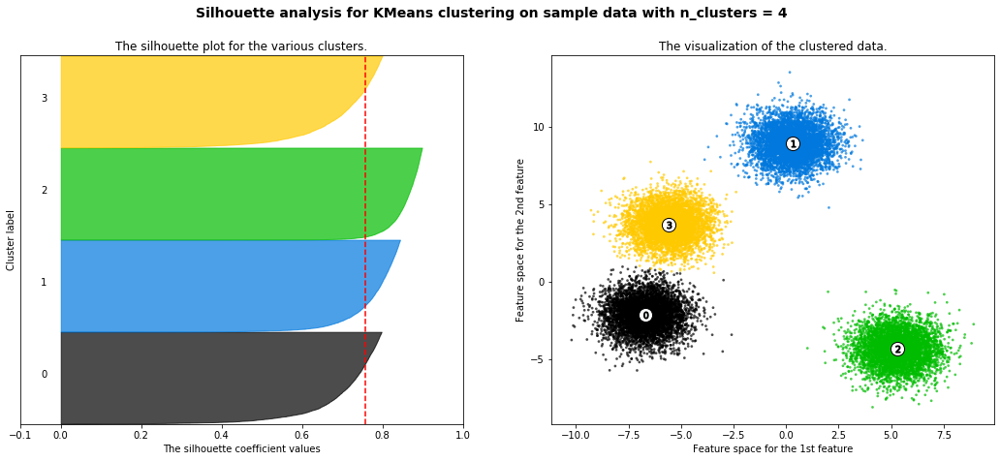

For n_clusters = 5 The average silhouette_score is : 0.6407067241958382


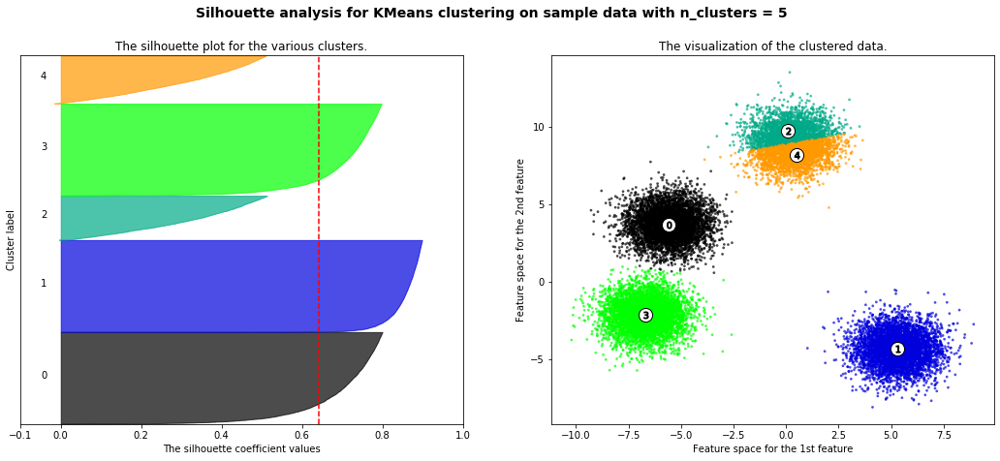





For n_clusters = 2 The average silhouette_score is : 0.6980849050583402


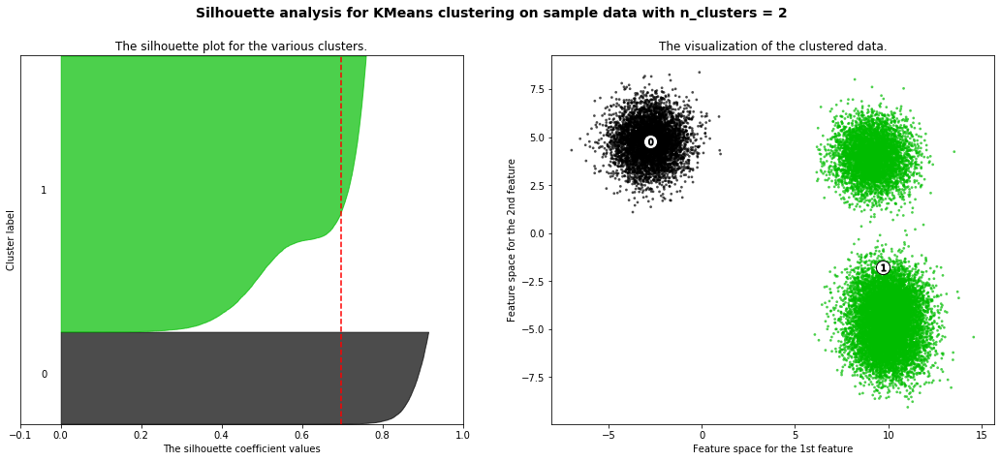

For n_clusters = 3 The average silhouette_score is : 0.7851362058293302


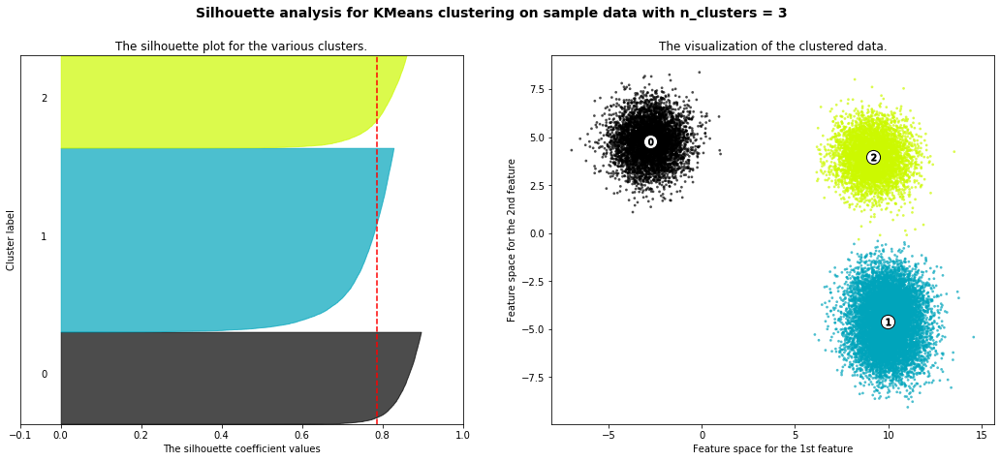

For n_clusters = 4 The average silhouette_score is : 0.5967070787463548


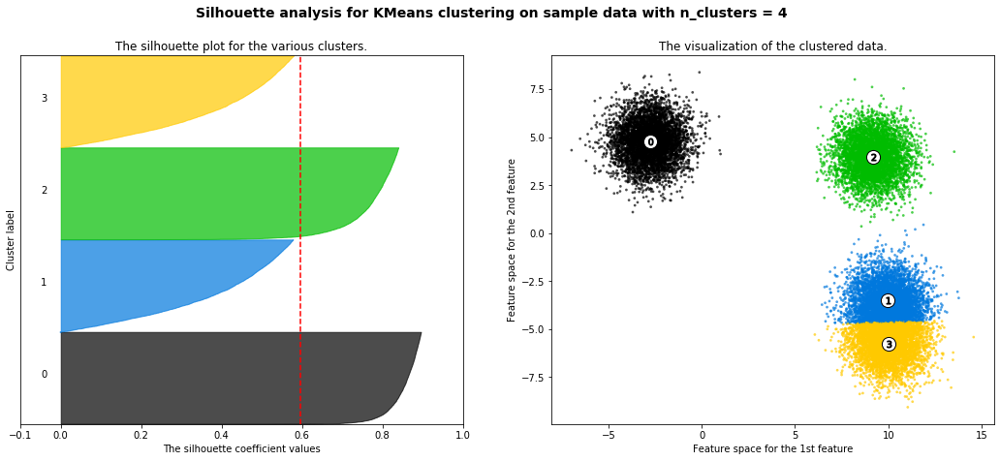

For n_clusters = 5 The average silhouette_score is : 0.5668562884784155


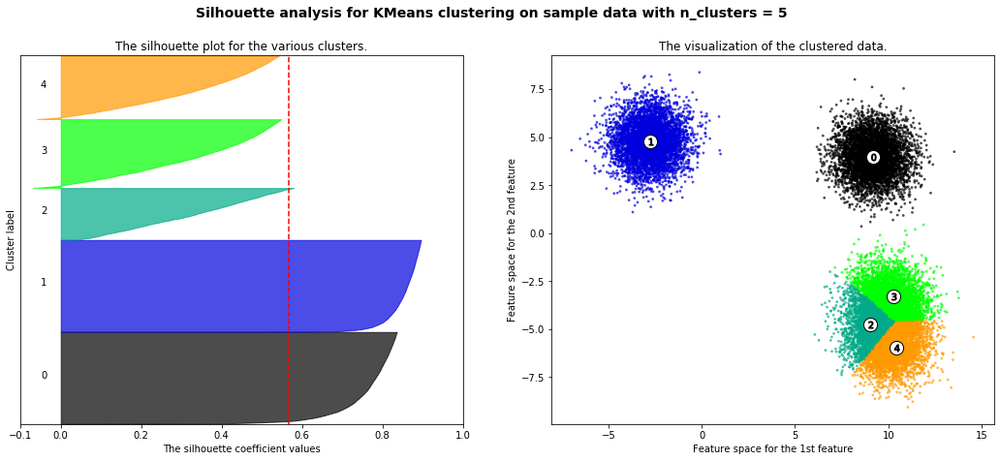

In [127]:
for random_state in range(25):
    X, y = make_blobs(n_samples=20000,
                      n_features=2,
                      centers=4,
                      cluster_std=1,
                      center_box=(-10.0, 10.0),
                      shuffle=True,
                      random_state=random_state)
    print('')
    print('')
    print('')
    print('')
    for n_clusters in [2, 3, 4, 5]:
        cluster(n_clusters)

For n_clusters = 2 The average silhouette_score is : 0.6540769872894673


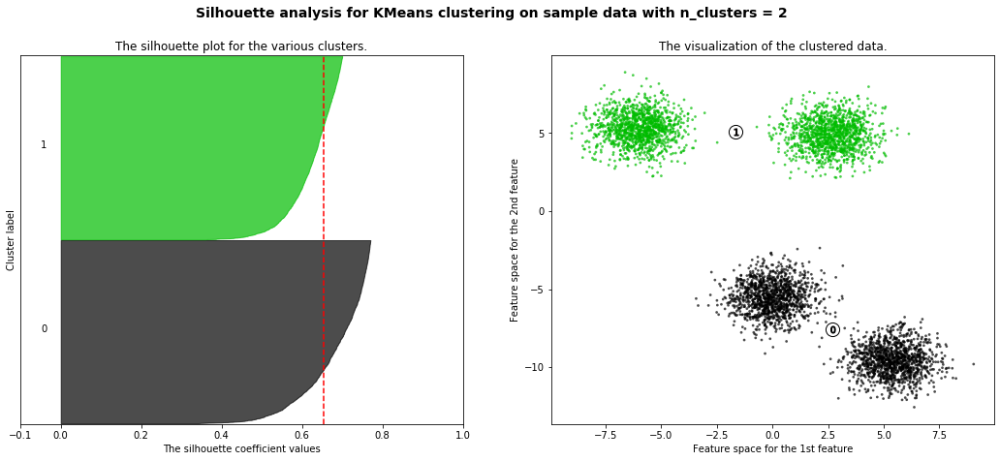

In [72]:
cluster(2)

For n_clusters = 3 The average silhouette_score is : 0.7235228296940286


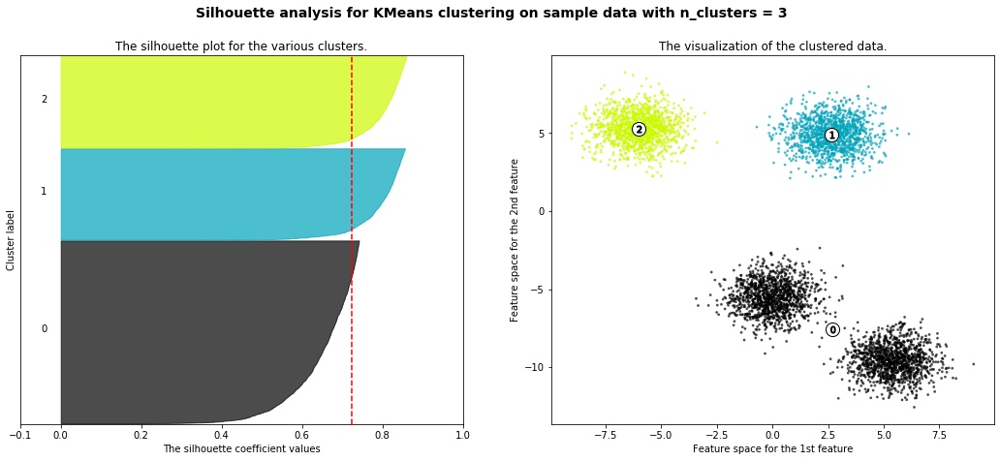

In [73]:
cluster(3)

For n_clusters = 4 The average silhouette_score is : 0.7686347787247372


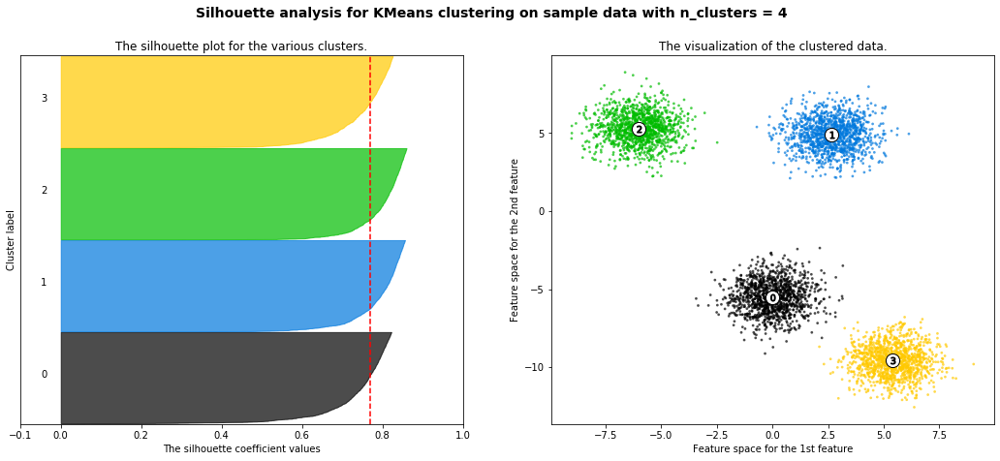

In [74]:
cluster(4)

For n_clusters = 5 The average silhouette_score is : 0.6443709634305811


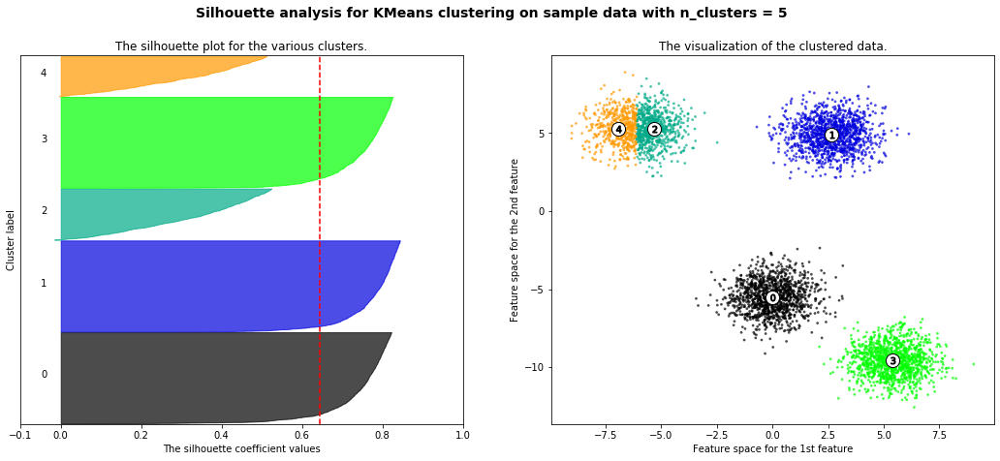

In [75]:
cluster(5)

For n_clusters = 6 The average silhouette_score is : 0.3664347948452936


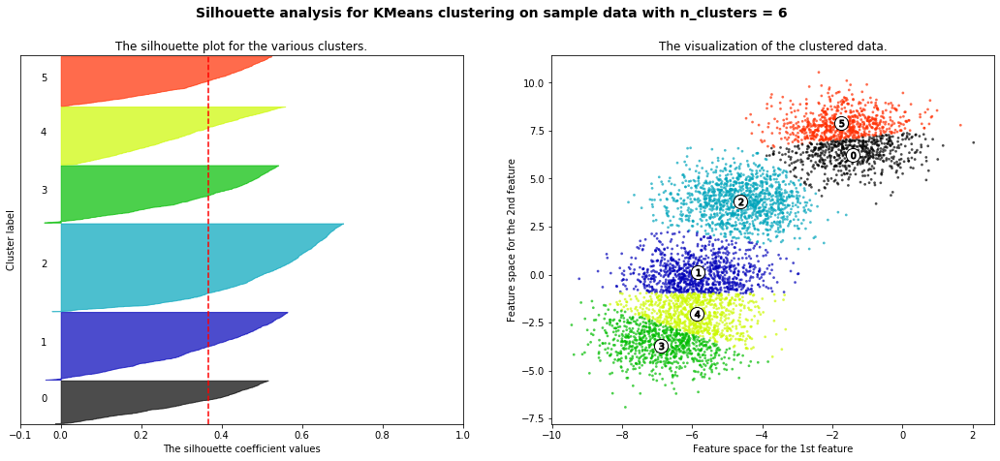

In [60]:
 cluster(6)

For n_clusters = 7 The average silhouette_score is : 0.33358285703452184


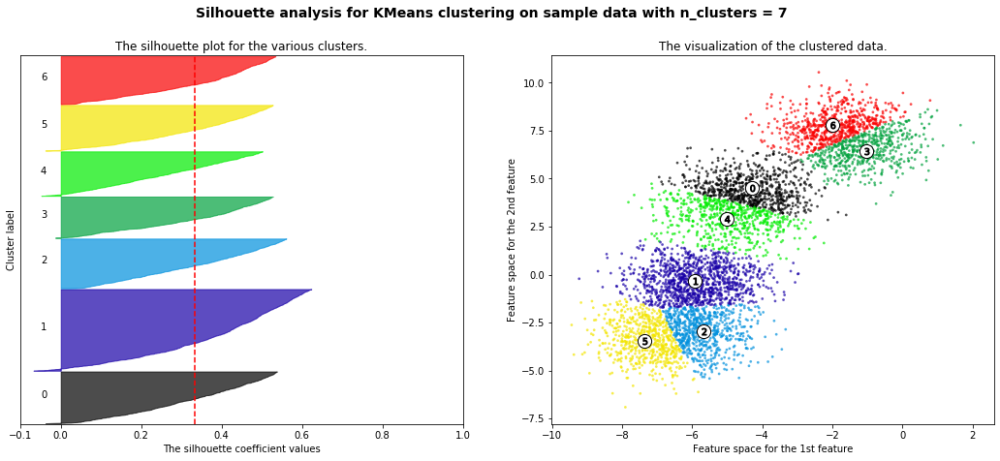

In [61]:
cluster(7)

For n_clusters = 8 The average silhouette_score is : 0.32180794648359945


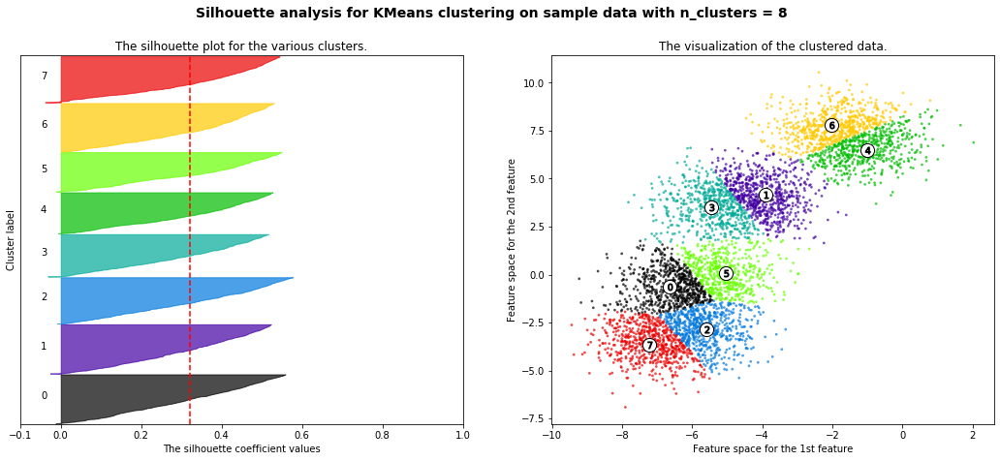

In [62]:
cluster(8)

For n_clusters = 9 The average silhouette_score is : 0.3226311621347682


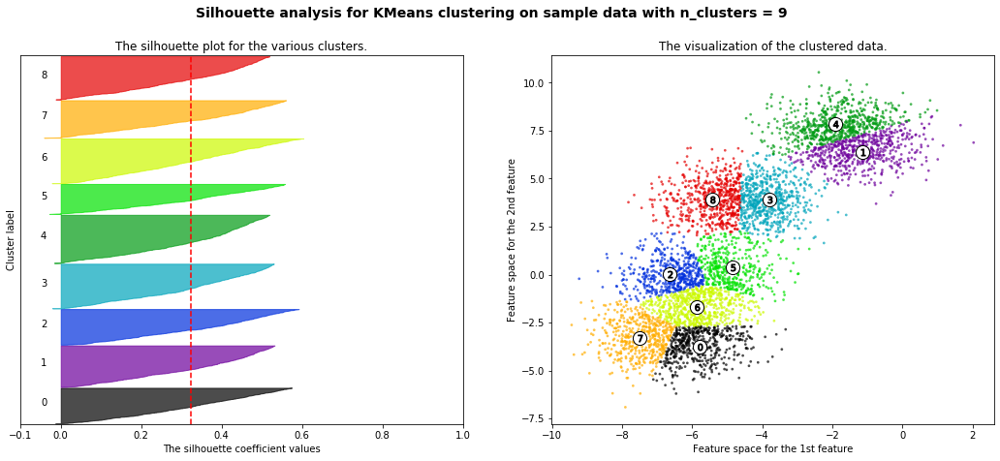

In [63]:
cluster(9)

For n_clusters = 10 The average silhouette_score is : 0.33081691537036156


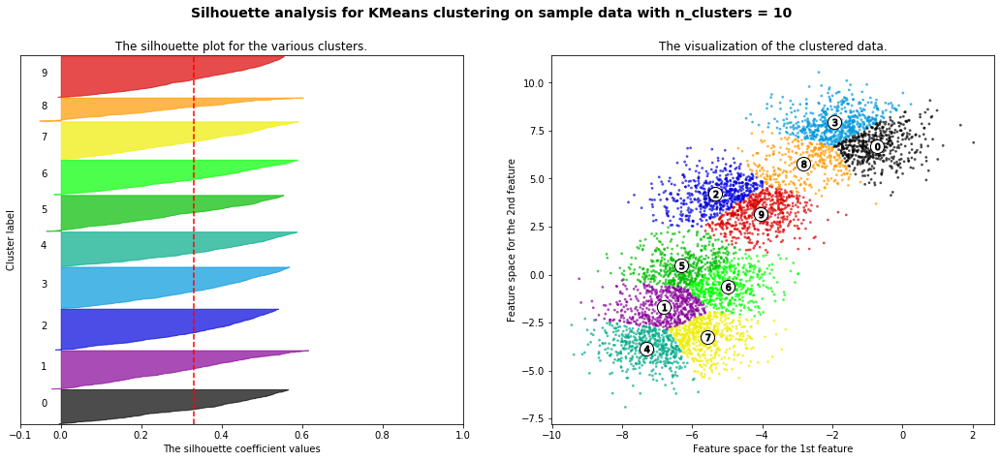

In [64]:
cluster(10)

For n_clusters = 12 The average silhouette_score is : 0.33019074356931233


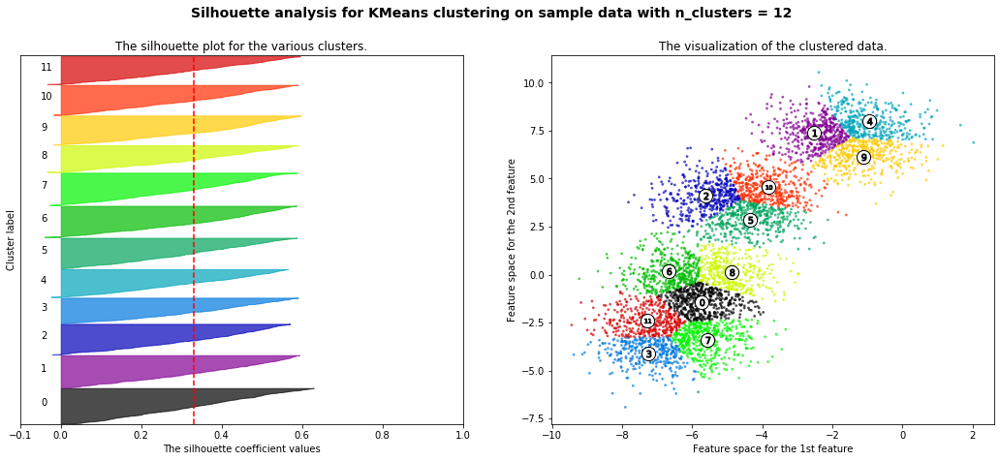

In [65]:
cluster(12)

For n_clusters = 24 The average silhouette_score is : 0.32484635966728437


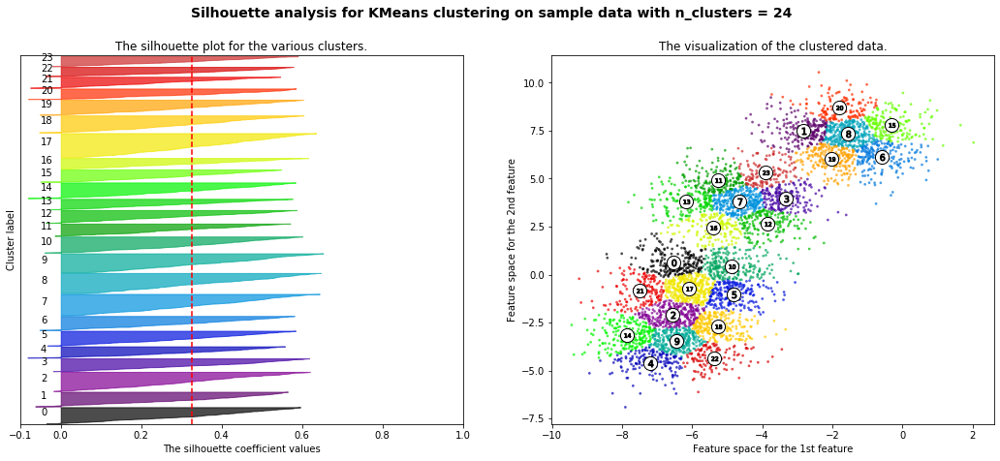

In [67]:
cluster(24)

For n_clusters = 1000 The average silhouette_score is : 0.3613190905610879


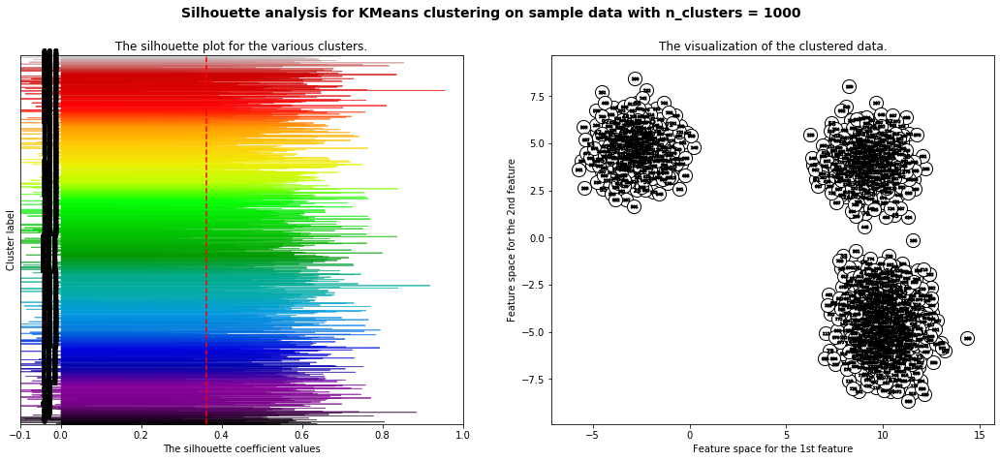

In [123]:
cluster(1000)

In [83]:
import pandas as pd

In [103]:
df = pd.DataFrame([[1, 2, 3], [1, 1, 1], [3, 3, 3], [3, 2, 1], [1, 1, 1], [2, 2, 2], [3, 3, 3], [1, 2, 3], [1, 2, 3]], columns=['A', 'B', 'C'])

In [104]:
df

,A,B,C
0,1,2,3
1,1,1,1
2,3,3,3
3,3,2,1
4,1,1,1
5,2,2,2
6,3,3,3
7,1,2,3
8,1,2,3


In [105]:
df.groupby('C').B.mean().reset_index()

,C,B
0,1,1.333333
1,2,2.000000
2,3,2.400000


In [106]:
pd.merge(df, df.groupby('C').B.mean().reset_index(), on='C')

,A,B_x,C,B_y
0,1,2,3,2.400000
1,3,3,3,2.400000
2,3,3,3,2.400000
3,1,2,3,2.400000
4,1,2,3,2.400000
5,1,1,1,1.333333
6,3,2,1,1.333333
7,1,1,1,1.333333
8,2,2,2,2.000000


In [112]:
df2 = df.copy()
df2['B_y'] = df2['B'].groupby(df2['C']).transform('mean')

In [113]:
df2

,A,B,C,B_y
0,1,2,3,2.400000
1,1,1,1,1.333333
2,3,3,3,2.400000
3,3,2,1,1.333333
4,1,1,1,1.333333
5,2,2,2,2.000000
6,3,3,3,2.400000
7,1,2,3,2.400000
8,1,2,3,2.400000
